In [1]:
import torch
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

print(device)

cuda:0


In [2]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

from sklearn.cluster import DBSCAN
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import GridSearchCV
from lightgbm import LGBMRegressor
from catboost import CatBoostClassifier

import pandas as pd
from category_encoders import OneHotEncoder, TargetEncoder

import warnings

# 경고 무시
warnings.filterwarnings("ignore", category=FutureWarning)

import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

# 한글 폰트 설정
plt.rcParams['font.family'] = 'Malgun Gothic'  # 예시로 'NanumGothic'을 사용

In [3]:
import random
import os

def seed_everything(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_everything(42) # Seed 고정

In [4]:
train = pd.read_csv("../data/train.csv")
test = pd.read_csv("../data/test.csv")

In [5]:
train = train.drop(['ID','Race'], axis=1)
test = test.drop(['ID','Race'], axis=1)

In [6]:
train

,Age,Gender,Education_Status,Employment_Status,Working_Week (Yearly),Industry_Status,Occupation_Status,Hispanic_Origin,Martial_Status,Household_Status,...,Citizenship,Birth_Country,Birth_Country (Father),Birth_Country (Mother),Tax_Status,Gains,Losses,Dividends,Income_Status,Income
0,63,M,Middle (7-8),Full-Time,4,Social Services,Services,All other,Married,Householder,...,Native,US,US,US,Nonfiler,0,0,0,Unknown,425
1,37,M,Associates degree (Vocational),Full-Time,52,Entertainment,Services,All other,Separated,Nonfamily householder,...,Native,US,US,US,Single,0,0,0,Under Median,0
2,58,F,High graduate,Full-Time,52,Manufacturing (Non-durable),Admin Support (include Clerical),All other,Married,Householder,...,Native,US,US,US,Married Filling Jointly both under 65 (MFJ),3411,0,0,Under Median,860
3,44,M,High graduate,Full-Time,52,Retail,Technicians & Support,All other,Divorced,Nonfamily householder,...,Native,US,US,US,Single,0,0,0,Under Median,850
4,37,F,High graduate,Full-Time,52,Retail,Sales,All other,Divorced,Householder,...,Native,US,US,US,Head of Household (HOH),0,0,0,Unknown,570
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,33,M,High graduate,Children or Armed Forces,52,Manufacturing (Durable),Handlers/Cleaners,All other,Single,Nonfamily householder,...,Native,US,US,US,Single,0,0,0,Under Median,1300
19996,20,F,College,Full-Time,12,Education,Admin Support (include Clerical),Mexican-American,Single,Child 18+ never marr Not in a subfamily,...,Native,US,Mexico,Mexico,Nonfiler,0,0,0,Under Median,850
19997,22,M,College,Children or Armed Forces,52,Transportation,Technicians & Support,All other,Single,In group quarters,...,Native,US,US,US,Single,0,0,0,Unknown,999
19998,76,F,High graduate,Not Working,0,Not in universe or children,Unknown,All other,Widowed,Nonfamily householder,...,Native,US,Scotland,England,Single,0,0,0,Under Median,0


In [7]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     20000 non-null  int64 
 1   Gender                  20000 non-null  object
 2   Education_Status        20000 non-null  object
 3   Employment_Status       20000 non-null  object
 4   Working_Week (Yearly)   20000 non-null  int64 
 5   Industry_Status         20000 non-null  object
 6   Occupation_Status       20000 non-null  object
 7   Hispanic_Origin         20000 non-null  object
 8   Martial_Status          20000 non-null  object
 9   Household_Status        20000 non-null  object
 10  Household_Summary       20000 non-null  object
 11  Citizenship             20000 non-null  object
 12  Birth_Country           20000 non-null  object
 13  Birth_Country (Father)  20000 non-null  object
 14  Birth_Country (Mother)  20000 non-null  object
 15  Ta

In [8]:
test['Household_Status'].fillna('Nonfamily householder', inplace=True)

In [9]:
# 연속형 변수 추출
train_int = train[train.describe().columns]
test_int = test[test.describe().columns]

In [10]:
test_int

,Age,Working_Week (Yearly),Gains,Losses,Dividends
0,79,0,0,0,0
1,47,0,0,0,0
2,18,52,0,0,0
3,39,30,0,0,0
4,6,0,0,0,0
...,...,...,...,...,...
9995,31,52,0,0,0
9996,27,52,0,0,0
9997,18,7,0,0,0
9998,9,0,0,0,0


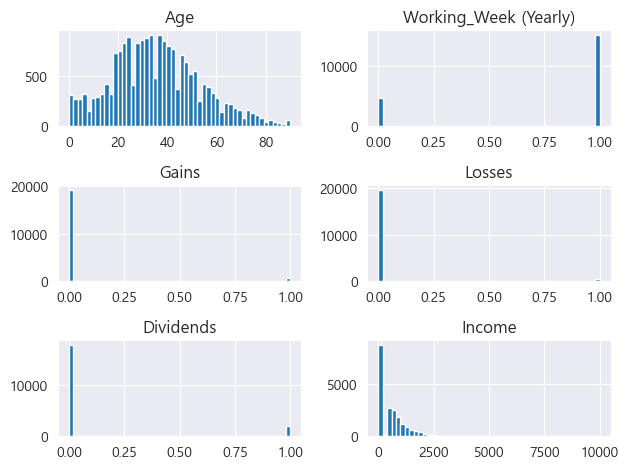

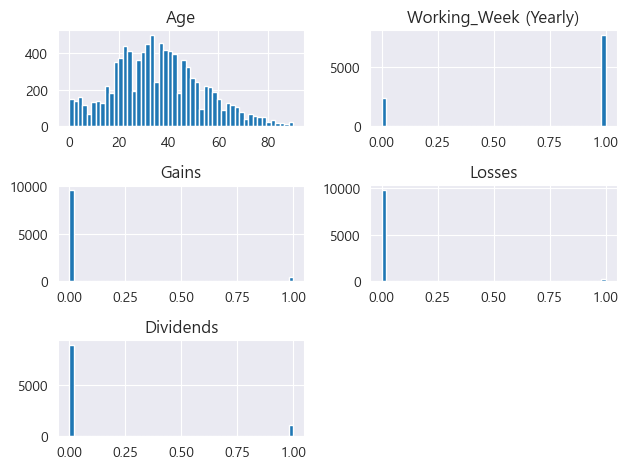

In [11]:
zeroone= [train_int.iloc[:,i].apply(lambda x: 0 if x == 0 else 1) for i in range(1,5)]
df_zeroone= pd.DataFrame(zeroone).T
df_int_zeroone= pd.concat([train_int.iloc[:,[0]],df_zeroone,train_int.iloc[:,[-1]]],axis=1)
df_int_zeroone.hist(bins=50);
plt.tight_layout()

plt.show()


zeroone2= [test_int.iloc[:,i].apply(lambda x: 0 if x == 0 else 1) for i in range(1,5)]
df_zeroone2= pd.DataFrame(zeroone2).T
df_int_zeroone2= pd.concat([test_int.iloc[:,[0]],df_zeroone2],axis=1)
df_int_zeroone2.hist(bins=50);
plt.tight_layout()

plt.show()

In [12]:
df_int_zeroone2

,Age,Working_Week (Yearly),Gains,Losses,Dividends
0,79,0,0,0,0
1,47,0,0,0,0
2,18,1,0,0,0
3,39,1,0,0,0
4,6,0,0,0,0
...,...,...,...,...,...
9995,31,1,0,0,0
9996,27,1,0,0,0
9997,18,1,0,0,0
9998,9,0,0,0,0


In [13]:
# 원-핫 인코딩을 적용할 열 지정
one_hot_cols = ['Gender', 'Income_Status','Citizenship','Education_Status','Industry_Status','Occupation_Status','Martial_Status','Tax_Status']
# one_hot_cols = ['Gender', 'Income_Status','Tax_Status','Citizenship','Industry_Status','Occupation_Status']
# 원-핫 인코더 생성 및 train 데이터에 적용
one_hot_encoder = OneHotEncoder(cols=one_hot_cols, use_cat_names=True)
train_encoded = one_hot_encoder.fit_transform(train[one_hot_cols])

# 동일한 원-핫 인코더를 test 데이터에 적용
test_encoded = one_hot_encoder.transform(test[one_hot_cols])

In [14]:
# 레이블 인코더 객체 생성
label_encoder = LabelEncoder()

# one_hot_cols에 명시된 열을 제외한 카테고리형 변수를 인코딩 대상으로 설정
encoding_target = [col for col in train.columns if train[col].dtype == 'object' and col not in one_hot_cols]

# 인코딩 대상 열에 대해 레이블 인코딩 적용
for col in encoding_target:
    # train과 test 데이터셋에서 해당 열의 모든 값을 문자열로 변환
    test_encoded[col] = train[col].astype(str)
    test_encoded[col] = test[col].astype(str)

    # 레이블 인코더를 train 데이터에 적합시키고 변환
    label_encoder.fit(train[col])
    train_encoded[col] = label_encoder.transform(train[col])

    # test 데이터에도 동일한 인코더를 적용
    test_encoded[col] = label_encoder.transform(test[col])

In [15]:
train_encoded = pd.concat([train_encoded, train[['Working_Week (Yearly)','Age','Gains','Losses','Income']]], axis=1)
test_encoded = pd.concat([test_encoded, test[['Working_Week (Yearly)','Age','Gains','Losses']]], axis=1)

train = train_encoded
test = test_encoded

In [16]:
train = train.drop(train[train['Gains'] > 60000].index)
train = train.drop(train[train['Income'] > 8000].index)

train['working_week_0'] = (train['Working_Week (Yearly)']==0).astype(int)
test['working_week_0'] = (test['Working_Week (Yearly)']==0).astype(int)

train['working_week_1'] = ((train['Working_Week (Yearly)']>0) & (train['Working_Week (Yearly)']<10)).astype(int)
test['working_week_1'] = ((train['Working_Week (Yearly)']>0) & (train['Working_Week (Yearly)']<10)).astype(int)

train['working_week_2'] = ((train['Working_Week (Yearly)']>=10) & (train['Working_Week (Yearly)']<45)).astype(int)
test['working_week_2'] = ((train['Working_Week (Yearly)']>=10) & (train['Working_Week (Yearly)']<45)).astype(int)

train['working_week_3'] = ((train['Working_Week (Yearly)']>=45) & (train['Working_Week (Yearly)']<52)).astype(int)
test['working_week_3'] = ((train['Working_Week (Yearly)']>=45) & (train['Working_Week (Yearly)']<52)).astype(int)

train['working_week_4']=(train['Working_Week (Yearly)']==52).astype(int)
test['working_week_4']=(test['Working_Week (Yearly)']==52).astype(int)

In [17]:
train

,Gender_M,Gender_F,Income_Status_Unknown,Income_Status_Under Median,Income_Status_Over Median,Citizenship_Native,Citizenship_Foreign-born (Non-US Citizen),Citizenship_Native (Born in Puerto Rico or US Outlying),Citizenship_Foreign-born (Naturalized US Citizen),Citizenship_Native (Born Abroad),...,Working_Week (Yearly),Age,Gains,Losses,Income,working_week_0,working_week_1,working_week_2,working_week_3,working_week_4
0,1,0,1,0,0,1,0,0,0,0,...,4,63,0,0,425,0,1,0,0,0
1,1,0,0,1,0,1,0,0,0,0,...,52,37,0,0,0,0,0,0,0,1
2,0,1,0,1,0,1,0,0,0,0,...,52,58,3411,0,860,0,0,0,0,1
3,1,0,0,1,0,1,0,0,0,0,...,52,44,0,0,850,0,0,0,0,1
4,0,1,1,0,0,1,0,0,0,0,...,52,37,0,0,570,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1,0,0,1,0,1,0,0,0,0,...,52,33,0,0,1300,0,0,0,0,1
19996,0,1,0,1,0,1,0,0,0,0,...,12,20,0,0,850,0,0,1,0,0
19997,1,0,1,0,0,1,0,0,0,0,...,52,22,0,0,999,0,0,0,0,1
19998,0,1,0,1,0,1,0,0,0,0,...,0,76,0,0,0,1,0,0,0,0


In [18]:
import numpy as np

# Employment_Status 컬럼에서 조건을 만족하면 1, 그렇지 않으면 0을 할당
train['Status_Indicator'] = np.where(
    train['Employment_Status'].isin([
        1,2,4,5
    ]),
    1,
    0
)

# Employment_Status 컬럼에서 조건을 만족하면 1, 그렇지 않으면 0을 할당
test['Status_Indicator'] = np.where(
    test['Employment_Status'].isin([
        1,2,4,5
    ]),
    1,
    0
)


In [19]:

train['Gains'] = df_int_zeroone['Gains']
train['Losses'] = df_int_zeroone['Losses']
train['Dividends'] = df_int_zeroone['Dividends']


test['Gains'] = df_int_zeroone2['Gains']
test['Losses'] = df_int_zeroone2['Losses']
test['Dividends'] = df_int_zeroone2['Dividends']

In [20]:
# train['Education_Status'] = X_encoded ['Education_Status']
# train['Employment_Status'] = X_encoded ['Employment_Status']
# train['Industry_Status'] = X_encoded ['Industry_Status']
# train['Occupation_Status'] = X_encoded ['Occupation_Status']
# train['Martial_Status'] = X_encoded ['Martial_Status']
# train['Household_Status'] = X_encoded ['Household_Status']
# train['Tax_Status'] = X_encoded ['Tax_Status']
# 
# test['Education_Status'] = X_test_encoded ['Education_Status']
# test['Employment_Status'] = X_test_encoded ['Employment_Status']
# test['Industry_Status'] = X_test_encoded ['Industry_Status']
# test['Occupation_Status'] = X_test_encoded ['Occupation_Status']
# test['Martial_Status'] = X_test_encoded ['Martial_Status']
# test['Household_Status'] = X_test_encoded ['Household_Status']
# test['Tax_Status'] = X_test_encoded ['Tax_Status']

In [21]:
train

,Gender_M,Gender_F,Income_Status_Unknown,Income_Status_Under Median,Income_Status_Over Median,Citizenship_Native,Citizenship_Foreign-born (Non-US Citizen),Citizenship_Native (Born in Puerto Rico or US Outlying),Citizenship_Foreign-born (Naturalized US Citizen),Citizenship_Native (Born Abroad),...,Gains,Losses,Income,working_week_0,working_week_1,working_week_2,working_week_3,working_week_4,Status_Indicator,Dividends
0,1,0,1,0,0,1,0,0,0,0,...,0,0,425,0,1,0,0,0,1,0
1,1,0,0,1,0,1,0,0,0,0,...,0,0,0,0,0,0,0,1,1,0
2,0,1,0,1,0,1,0,0,0,0,...,1,0,860,0,0,0,0,1,1,0
3,1,0,0,1,0,1,0,0,0,0,...,0,0,850,0,0,0,0,1,1,0
4,0,1,1,0,0,1,0,0,0,0,...,0,0,570,0,0,0,0,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1,0,0,1,0,1,0,0,0,0,...,0,0,1300,0,0,0,0,1,0,0
19996,0,1,0,1,0,1,0,0,0,0,...,0,0,850,0,0,1,0,0,1,0
19997,1,0,1,0,0,1,0,0,0,0,...,0,0,999,0,0,0,0,1,0,0
19998,0,1,0,1,0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0


In [22]:
test

,Gender_M,Gender_F,Income_Status_Unknown,Income_Status_Under Median,Income_Status_Over Median,Citizenship_Native,Citizenship_Foreign-born (Non-US Citizen),Citizenship_Native (Born in Puerto Rico or US Outlying),Citizenship_Foreign-born (Naturalized US Citizen),Citizenship_Native (Born Abroad),...,Age,Gains,Losses,working_week_0,working_week_1,working_week_2,working_week_3,working_week_4,Status_Indicator,Dividends
0,1,0,0,1,0,1,0,0,0,0,...,79,0,0,1,1.0,0.0,0.0,0,0,0
1,1,0,0,1,0,1,0,0,0,0,...,47,0,0,1,0.0,0.0,0.0,0,0,0
2,0,1,0,1,0,1,0,0,0,0,...,18,0,0,0,0.0,0.0,0.0,1,0,0
3,0,1,1,0,0,1,0,0,0,0,...,39,0,0,0,0.0,0.0,0.0,0,1,0
4,1,0,1,0,0,1,0,0,0,0,...,6,0,0,1,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,0,1,0,1,0,0,0,0,...,31,0,0,0,0.0,0.0,0.0,1,0,0
9996,1,0,0,1,0,1,0,0,0,0,...,27,0,0,0,0.0,0.0,0.0,1,0,0
9997,1,0,0,1,0,1,0,0,0,0,...,18,0,0,0,0.0,0.0,0.0,0,0,0
9998,1,0,0,1,0,1,0,0,0,0,...,9,0,0,1,0.0,0.0,0.0,0,0,0


In [23]:
# train['Income'] = np.log1p(train['Income'])

In [24]:
X = train[train.columns.drop('Income')]
Y = train['Income']

In [25]:
# X와 Y로 나누기
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True)

In [78]:
import optuna
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import numpy as np

def objective(trial):
    # 모델 선택
    # model_type = trial.suggest_categorical('model_type', ['xgboost', 'lightgbm', 'random_forest', 'gradient_boosting'])
    model_type = 'lightgbm'
    # 모델 별 파라미터 설정
    if model_type == 'xgboost':
        param = {
            'objective': 'reg:squarederror',
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 9),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 9),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            # L1 정규화 매개변수 (alpha)
            'alpha': trial.suggest_float('alpha', 0.0, 1.0),
            # L2 정규화 매개변수 (lambda)
            'lambda': trial.suggest_float('lambda', 1.0, 100.0),
        }
        model = XGBRegressor(**param)
    elif model_type == 'lightgbm':
        param = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', -1, 9),
            'num_leaves': trial.suggest_int('num_leaves', 2, 256),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        }
        model = LGBMRegressor(**param)
    elif model_type == 'random_forest':
        param = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 9),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 14),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
        }
        model = RandomForestRegressor(**param)
    elif model_type == 'gradient_boosting':
        param = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'max_depth': trial.suggest_int('max_depth', 3, 9),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 14),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 8),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        }
        model = GradientBoostingRegressor(**param)

    elif model_type == 'catboost':
        param = {
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
            'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
            'depth': trial.suggest_int('depth', 4, 10),
            'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 10),
            'border_count': trial.suggest_int('border_count', 1, 255),
            'logging_level': 'Silent',
        }
        model = CatBoostRegressor(**param)

    # 모델 학습
    model.fit(X_train, y_train)

    # 예측 및 평가
    preds = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, preds))

    return rmse

# Optuna 최적화 실행
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=300)

# 최적의 파라미터 출력
print(f"Best trial: {study.best_trial.params}")

[I 2024-04-03 20:48:51,319] A new study created in memory with name: no-name-dae47c69-b95d-4ffb-9d5e-5648c53d853b
[I 2024-04-03 20:48:51,458] Trial 0 finished with value: 544.8093256603507 and parameters: {'learning_rate': 0.055506890730841744, 'n_estimators': 363, 'max_depth': 3, 'num_leaves': 222, 'min_child_samples': 56, 'subsample': 0.5204701571899925, 'colsample_bytree': 0.5943956207320855}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:51,603] Trial 1 finished with value: 545.1065115679397 and parameters: {'learning_rate': 0.057679771771797256, 'n_estimators': 384, 'max_depth': 3, 'num_leaves': 145, 'min_child_samples': 41, 'subsample': 0.8039994043992331, 'colsample_bytree': 0.6131075127316148}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:52,252] Trial 2 finished with value: 570.4842488650891 and parameters: {'learning_rate': 0.1716191966000049, 'n_estimators': 879, 'max_depth': 8, 'num_leaves': 58, 'min_child_samples': 95, 'subsample': 0.6539141025338251, 'colsample_bytree': 0.8022096150926374}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904


[I 2024-04-03 20:48:54,559] Trial 3 finished with value: 623.1436326117246 and parameters: {'learning_rate': 0.16821846139271993, 'n_estimators': 766, 'max_depth': -1, 'num_leaves': 213, 'min_child_samples': 15, 'subsample': 0.7433229520381317, 'colsample_bytree': 0.9138553810781651}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000696 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:54,779] Trial 4 finished with value: 547.9283938974331 and parameters: {'learning_rate': 0.10476216093821077, 'n_estimators': 226, 'max_depth': 8, 'num_leaves': 171, 'min_child_samples': 38, 'subsample': 0.9214428389017844, 'colsample_bytree': 0.7505341136429319}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:55,009] Trial 5 finished with value: 548.644506760213 and parameters: {'learning_rate': 0.10355277858011523, 'n_estimators': 238, 'max_depth': 9, 'num_leaves': 101, 'min_child_samples': 62, 'subsample': 0.7197523256889165, 'colsample_bytree': 0.6651589680847941}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:55,580] Trial 6 finished with value: 566.0663518901496 and parameters: {'learning_rate': 0.10566191733716719, 'n_estimators': 720, 'max_depth': 7, 'num_leaves': 225, 'min_child_samples': 22, 'subsample': 0.5940627759333466, 'colsample_bytree': 0.9497373792610551}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:55,937] Trial 7 finished with value: 574.3940159065513 and parameters: {'learning_rate': 0.2634468559518405, 'n_estimators': 384, 'max_depth': 9, 'num_leaves': 180, 'min_child_samples': 50, 'subsample': 0.5654545621712761, 'colsample_bytree': 0.5152629790848544}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:56,108] Trial 8 finished with value: 547.6164712726617 and parameters: {'learning_rate': 0.19963389480926647, 'n_estimators': 307, 'max_depth': 5, 'num_leaves': 88, 'min_child_samples': 71, 'subsample': 0.8610118921577643, 'colsample_bytree': 0.8931206680408033}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:56,440] Trial 9 finished with value: 546.1948787487958 and parameters: {'learning_rate': 0.07020645139826859, 'n_estimators': 572, 'max_depth': 6, 'num_leaves': 73, 'min_child_samples': 88, 'subsample': 0.9430050763936411, 'colsample_bytree': 0.7794500403858117}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:56,537] Trial 10 finished with value: 570.4720260630386 and parameters: {'learning_rate': 0.022893957432901513, 'n_estimators': 122, 'max_depth': 2, 'num_leaves': 252, 'min_child_samples': 78, 'subsample': 0.5026905403906506, 'colsample_bytree': 0.5021142330713356}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000720 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904


[I 2024-04-03 20:48:56,707] Trial 11 finished with value: 566.6739131215896 and parameters: {'learning_rate': 0.020299163153999343, 'n_estimators': 449, 'max_depth': 3, 'num_leaves': 2, 'min_child_samples': 40, 'subsample': 0.8286743641296936, 'colsample_bytree': 0.6286185806643243}. Best is trial 0 with value: 544.8093256603507.
[I 2024-04-03 20:48:56,895] Trial 12 finished with value: 556.1040088255763 and parameters: {'learning_rate': 0.05879947805253954, 'n_estimators': 514, 'max_depth': 1, 'num_leaves': 145, 'min_child_samples': 32, 'subsample': 0.80637128548069, 'colsample_bytree': 0.6144651772143499}. Best is trial 0 with value: 544.8093256603507.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No fu

[I 2024-04-03 20:48:57,310] Trial 13 finished with value: 544.2430054474581 and parameters: {'learning_rate': 0.06765871233916126, 'n_estimators': 617, 'max_depth': 4, 'num_leaves': 133, 'min_child_samples': 56, 'subsample': 0.6618620049405213, 'colsample_bytree': 0.5714529511692937}. Best is trial 13 with value: 544.2430054474581.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:57,629] Trial 14 finished with value: 546.3778469926929 and parameters: {'learning_rate': 0.13181836790340368, 'n_estimators': 602, 'max_depth': 4, 'num_leaves': 194, 'min_child_samples': 58, 'subsample': 0.6605912153359599, 'colsample_bytree': 0.5456118385695532}. Best is trial 13 with value: 544.2430054474581.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904


[I 2024-04-03 20:48:58,302] Trial 15 finished with value: 587.2263643106533 and parameters: {'learning_rate': 0.28947553287205496, 'n_estimators': 684, 'max_depth': 0, 'num_leaves': 35, 'min_child_samples': 69, 'subsample': 0.5066634369610961, 'colsample_bytree': 0.6838966903858993}. Best is trial 13 with value: 544.2430054474581.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:58,842] Trial 16 finished with value: 541.4722416840341 and parameters: {'learning_rate': 0.018025427721349935, 'n_estimators': 941, 'max_depth': 5, 'num_leaves': 114, 'min_child_samples': 52, 'subsample': 0.6030670212679445, 'colsample_bytree': 0.5630534325325215}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:48:59,462] Trial 17 finished with value: 544.3223184107221 and parameters: {'learning_rate': 0.014980501271811239, 'n_estimators': 988, 'max_depth': 5, 'num_leaves': 114, 'min_child_samples': 7, 'subsample': 0.6631684287551448, 'colsample_bytree': 0.6895888272325976}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:48:59,939] Trial 18 finished with value: 563.058773648385 and parameters: {'learning_rate': 0.22267078333268361, 'n_estimators': 850, 'max_depth': 5, 'num_leaves': 132, 'min_child_samples': 51, 'subsample': 0.6040662814977757, 'colsample_bytree': 0.5566892461597638}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:00,543] Trial 19 finished with value: 552.9662443378852 and parameters: {'learning_rate': 0.08334759445373754, 'n_estimators': 968, 'max_depth': 6, 'num_leaves': 159, 'min_child_samples': 78, 'subsample': 0.7310403273870947, 'colsample_bytree': 0.7111815117993451}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:00,997] Trial 20 finished with value: 553.1587982976952 and parameters: {'learning_rate': 0.13756778043734424, 'n_estimators': 830, 'max_depth': 4, 'num_leaves': 121, 'min_child_samples': 30, 'subsample': 0.686057553238677, 'colsample_bytree': 0.833632160935311}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:01,599] Trial 21 finished with value: 543.8840030941171 and parameters: {'learning_rate': 0.015184539560298055, 'n_estimators': 980, 'max_depth': 5, 'num_leaves': 115, 'min_child_samples': 8, 'subsample': 0.6274724637153956, 'colsample_bytree': 0.5807244904156288}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:02,231] Trial 22 finished with value: 548.6447034273643 and parameters: {'learning_rate': 0.038394033029135057, 'n_estimators': 902, 'max_depth': 6, 'num_leaves': 91, 'min_child_samples': 22, 'subsample': 0.6208101370325629, 'colsample_bytree': 0.568921581645347}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:02,434] Trial 23 finished with value: 548.4612480486256 and parameters: {'learning_rate': 0.0407625125878334, 'n_estimators': 652, 'max_depth': 2, 'num_leaves': 112, 'min_child_samples': 7, 'subsample': 0.5931695817334777, 'colsample_bytree': 0.6583079976997768}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:02,774] Trial 24 finished with value: 544.4469299969793 and parameters: {'learning_rate': 0.014207372000850387, 'n_estimators': 763, 'max_depth': 4, 'num_leaves': 47, 'min_child_samples': 45, 'subsample': 0.5541397406589663, 'colsample_bytree': 0.5508834067973807}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:03,469] Trial 25 finished with value: 552.8332314592109 and parameters: {'learning_rate': 0.08260247818155927, 'n_estimators': 925, 'max_depth': 7, 'num_leaves': 139, 'min_child_samples': 64, 'subsample': 0.6920694834718274, 'colsample_bytree': 0.5856401060100173}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:03,987] Trial 26 finished with value: 545.2380903426933 and parameters: {'learning_rate': 0.0408486423580629, 'n_estimators': 997, 'max_depth': 5, 'num_leaves': 76, 'min_child_samples': 82, 'subsample': 0.6199662921129597, 'colsample_bytree': 0.6364865411791586}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 478
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 87
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:04,528] Trial 27 finished with value: 550.5495461617223 and parameters: {'learning_rate': 0.08126522617798958, 'n_estimators': 802, 'max_depth': 7, 'num_leaves': 155, 'min_child_samples': 99, 'subsample': 0.5585694411024066, 'colsample_bytree': 0.5024479667008648}. Best is trial 16 with value: 541.4722416840341.
[I 2024-04-03 20:49:04,724] Trial 28 finished with value: 548.6397231167977 and parameters: {'learning_rate': 0.0409892984861446, 'n_estimators': 491, 'max_depth': 2, 'num_leaves': 127, 'min_child_samples': 33, 'subsample': 0.6386313910777169, 'colsample_bytree': 0.7146156404118147}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000701 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:05,065] Trial 29 finished with value: 546.2255915213835 and parameters: {'learning_rate': 0.12254829772362424, 'n_estimators': 926, 'max_depth': 3, 'num_leaves': 22, 'min_child_samples': 57, 'subsample': 0.9892474717191307, 'colsample_bytree': 0.5907426288477287}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:05,375] Trial 30 finished with value: 544.7840878792344 and parameters: {'learning_rate': 0.062366459599753114, 'n_estimators': 614, 'max_depth': 4, 'num_leaves': 103, 'min_child_samples': 24, 'subsample': 0.703475504947777, 'colsample_bytree': 0.5459339006813811}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:05,933] Trial 31 finished with value: 544.2693515802465 and parameters: {'learning_rate': 0.014132710712313921, 'n_estimators': 940, 'max_depth': 5, 'num_leaves': 116, 'min_child_samples': 9, 'subsample': 0.6668273066297843, 'colsample_bytree': 0.6910110216957336}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:06,592] Trial 32 finished with value: 545.8502208127735 and parameters: {'learning_rate': 0.03251264525656365, 'n_estimators': 931, 'max_depth': 6, 'num_leaves': 78, 'min_child_samples': 15, 'subsample': 0.778772432076825, 'colsample_bytree': 0.5909386950629697}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:07,102] Trial 33 finished with value: 544.0546804789647 and parameters: {'learning_rate': 0.010245392840321133, 'n_estimators': 865, 'max_depth': 5, 'num_leaves': 157, 'min_child_samples': 16, 'subsample': 0.5457766641071281, 'colsample_bytree': 0.6394855823411025}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000718 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:07,497] Trial 34 finished with value: 545.8535679379979 and parameters: {'learning_rate': 0.04437786643061815, 'n_estimators': 867, 'max_depth': 4, 'num_leaves': 161, 'min_child_samples': 15, 'subsample': 0.5374374955561557, 'colsample_bytree': 0.6451336398822337}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:07,801] Trial 35 finished with value: 544.6909316743431 and parameters: {'learning_rate': 0.0559588673087237, 'n_estimators': 779, 'max_depth': 3, 'num_leaves': 190, 'min_child_samples': 47, 'subsample': 0.577223772147574, 'colsample_bytree': 0.6074027857144199}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[I 2024-04-03 20:49:08,399] Trial 36 finished with value: 543.4884199470614 and parameters: {'learning_rate': 0.02720834520765438, 'n_estimators': 731, 'max_depth': 6, 'num_leaves': 148, 'min_child_samples': 12, 'subsample': 0.6264315417557076, 'colsample_bytree': 0.5207810249739487}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:09,276] Trial 37 finished with value: 542.3678577413307 and parameters: {'learning_rate': 0.010771859253859997, 'n_estimators': 734, 'max_depth': 8, 'num_leaves': 175, 'min_child_samples': 17, 'subsample': 0.5396449542090755, 'colsample_bytree': 0.5221464978934252}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:10,140] Trial 38 finished with value: 548.3243080273376 and parameters: {'learning_rate': 0.02861686201423555, 'n_estimators': 729, 'max_depth': 8, 'num_leaves': 175, 'min_child_samples': 11, 'subsample': 0.5334652603526255, 'colsample_bytree': 0.5244032114324381}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 494
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 95
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:10,979] Trial 39 finished with value: 585.7179574194395 and parameters: {'learning_rate': 0.09755605550533972, 'n_estimators': 678, 'max_depth': 8, 'num_leaves': 206, 'min_child_samples': 5, 'subsample': 0.6333345748726763, 'colsample_bytree': 0.526418020003959}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:11,615] Trial 40 finished with value: 575.9572301788251 and parameters: {'learning_rate': 0.17137549352036094, 'n_estimators': 817, 'max_depth': 7, 'num_leaves': 230, 'min_child_samples': 27, 'subsample': 0.5980785422476941, 'colsample_bytree': 0.5356109872719496}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:12,243] Trial 41 finished with value: 545.0866492384409 and parameters: {'learning_rate': 0.026842665336295674, 'n_estimators': 881, 'max_depth': 6, 'num_leaves': 152, 'min_child_samples': 17, 'subsample': 0.5362976028945343, 'colsample_bytree': 0.5667187841266474}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:12,863] Trial 42 finished with value: 550.2461590243552 and parameters: {'learning_rate': 0.04748251528376997, 'n_estimators': 722, 'max_depth': 7, 'num_leaves': 174, 'min_child_samples': 19, 'subsample': 0.5766063806849245, 'colsample_bytree': 0.6034977886813774}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:14,023] Trial 43 finished with value: 555.4999553728613 and parameters: {'learning_rate': 0.025254934869951014, 'n_estimators': 888, 'max_depth': 9, 'num_leaves': 167, 'min_child_samples': 11, 'subsample': 0.5181487665545521, 'colsample_bytree': 0.9862803122919412}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:14,514] Trial 44 finished with value: 543.4490115270925 and parameters: {'learning_rate': 0.010608819316601348, 'n_estimators': 849, 'max_depth': 5, 'num_leaves': 146, 'min_child_samples': 36, 'subsample': 0.562483990039853, 'colsample_bytree': 0.5110630774346612}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:15,005] Trial 45 finished with value: 568.1767727500185 and parameters: {'learning_rate': 0.19123096717298324, 'n_estimators': 756, 'max_depth': 6, 'num_leaves': 100, 'min_child_samples': 37, 'subsample': 0.7574214551268617, 'colsample_bytree': 0.5082266541104964}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000632 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:15,901] Trial 46 finished with value: 541.7616959455532 and parameters: {'learning_rate': 0.010177406118938461, 'n_estimators': 961, 'max_depth': 8, 'num_leaves': 144, 'min_child_samples': 43, 'subsample': 0.5789206638198791, 'colsample_bytree': 0.520301361229862}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000641 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:16,649] Trial 47 finished with value: 552.944624559411 and parameters: {'learning_rate': 0.05649479978808334, 'n_estimators': 799, 'max_depth': 9, 'num_leaves': 143, 'min_child_samples': 44, 'subsample': 0.5780475909912693, 'colsample_bytree': 0.524077498993663}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:17,308] Trial 48 finished with value: 544.820531836325 and parameters: {'learning_rate': 0.02769581490968047, 'n_estimators': 679, 'max_depth': 8, 'num_leaves': 196, 'min_child_samples': 35, 'subsample': 0.5201045553771024, 'colsample_bytree': 0.8637474757016125}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:18,132] Trial 49 finished with value: 555.31587255669 and parameters: {'learning_rate': 0.07341994229749499, 'n_estimators': 840, 'max_depth': 8, 'num_leaves': 185, 'min_child_samples': 41, 'subsample': 0.609304454437202, 'colsample_bytree': 0.5038356618786002}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:19,077] Trial 50 finished with value: 611.5432109839559 and parameters: {'learning_rate': 0.2283194853846688, 'n_estimators': 949, 'max_depth': 9, 'num_leaves': 146, 'min_child_samples': 27, 'subsample': 0.5771884401320837, 'colsample_bytree': 0.5379282046506086}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:19,838] Trial 51 finished with value: 541.6168008495754 and parameters: {'learning_rate': 0.013167210257817627, 'n_estimators': 995, 'max_depth': 7, 'num_leaves': 122, 'min_child_samples': 54, 'subsample': 0.6428606219160454, 'colsample_bytree': 0.5678580936456352}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:20,540] Trial 52 finished with value: 541.5301923319976 and parameters: {'learning_rate': 0.010886928282765523, 'n_estimators': 902, 'max_depth': 7, 'num_leaves': 128, 'min_child_samples': 53, 'subsample': 0.6455524975097453, 'colsample_bytree': 0.5481713799398134}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:21,240] Trial 53 finished with value: 541.7769141397542 and parameters: {'learning_rate': 0.010571618960124651, 'n_estimators': 900, 'max_depth': 7, 'num_leaves': 135, 'min_child_samples': 54, 'subsample': 0.6423591810904309, 'colsample_bytree': 0.5592768396897407}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000712 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:21,899] Trial 54 finished with value: 547.0503615213496 and parameters: {'learning_rate': 0.04709915739591369, 'n_estimators': 966, 'max_depth': 7, 'num_leaves': 128, 'min_child_samples': 63, 'subsample': 0.6419720975874028, 'colsample_bytree': 0.6141032536350124}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:22,638] Trial 55 finished with value: 545.8152978838666 and parameters: {'learning_rate': 0.03366735628393694, 'n_estimators': 905, 'max_depth': 8, 'num_leaves': 133, 'min_child_samples': 53, 'subsample': 0.6761617527883663, 'colsample_bytree': 0.5593105329632261}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:23,365] Trial 56 finished with value: 544.2219043268548 and parameters: {'learning_rate': 0.021527355756925305, 'n_estimators': 997, 'max_depth': 7, 'num_leaves': 104, 'min_child_samples': 68, 'subsample': 0.7082350312036398, 'colsample_bytree': 0.7788752825582905}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000652 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:24,279] Trial 57 finished with value: 541.8659257490436 and parameters: {'learning_rate': 0.011576597910585731, 'n_estimators': 904, 'max_depth': 9, 'num_leaves': 95, 'min_child_samples': 53, 'subsample': 0.647047309034733, 'colsample_bytree': 0.5746922557801096}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000650 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:25,127] Trial 58 finished with value: 552.5351745426259 and parameters: {'learning_rate': 0.048370626035483734, 'n_estimators': 959, 'max_depth': 9, 'num_leaves': 82, 'min_child_samples': 49, 'subsample': 0.6470269106985624, 'colsample_bytree': 0.5701929560899163}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if m

[I 2024-04-03 20:49:25,790] Trial 59 finished with value: 576.6541851721922 and parameters: {'learning_rate': 0.14818809614147205, 'n_estimators': 341, 'max_depth': -1, 'num_leaves': 92, 'min_child_samples': 60, 'subsample': 0.8613794857925996, 'colsample_bytree': 0.6252344256958007}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:26,564] Trial 60 finished with value: 553.8752430652429 and parameters: {'learning_rate': 0.06859651737866222, 'n_estimators': 896, 'max_depth': 9, 'num_leaves': 63, 'min_child_samples': 54, 'subsample': 0.7264760076530807, 'colsample_bytree': 0.5511092663740613}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:27,377] Trial 61 finished with value: 543.9397654030681 and parameters: {'learning_rate': 0.01938096253389207, 'n_estimators': 911, 'max_depth': 8, 'num_leaves': 123, 'min_child_samples': 50, 'subsample': 0.608853325325288, 'colsample_bytree': 0.5790205370066581}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000777 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:28,237] Trial 62 finished with value: 541.9155076026226 and parameters: {'learning_rate': 0.010271250225676584, 'n_estimators': 965, 'max_depth': 8, 'num_leaves': 109, 'min_child_samples': 55, 'subsample': 0.6531570197894295, 'colsample_bytree': 0.5337164314494699}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:29,034] Trial 63 finished with value: 546.0995632307156 and parameters: {'learning_rate': 0.03568650725755129, 'n_estimators': 966, 'max_depth': 8, 'num_leaves': 111, 'min_child_samples': 44, 'subsample': 0.6806360697284825, 'colsample_bytree': 0.5387786617292603}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:29,769] Trial 64 finished with value: 542.8296424809007 and parameters: {'learning_rate': 0.018281707855965716, 'n_estimators': 994, 'max_depth': 7, 'num_leaves': 136, 'min_child_samples': 66, 'subsample': 0.6537365710588827, 'colsample_bytree': 0.5617419256683475}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:30,450] Trial 65 finished with value: 542.7182447643173 and parameters: {'learning_rate': 0.022259558730291666, 'n_estimators': 936, 'max_depth': 7, 'num_leaves': 93, 'min_child_samples': 60, 'subsample': 0.6911366380188272, 'colsample_bytree': 0.5955972869327867}. Best is trial 16 with value: 541.4722416840341.
[I 2024-04-03 20:49:30,646] Trial 66 finished with value: 544.4510707586396 and parameters: {'learning_rate': 0.036284022515619824, 'n_estimators': 131, 'max_depth': 8, 'num_leaves': 65, 'min_child_samples': 72, 'subsample': 0.5911188693127013, 'colsample_bytree': 0.5827867417443191}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:31,400] Trial 67 finished with value: 551.236992002665 and parameters: {'learning_rate': 0.051422879116762445, 'n_estimators': 880, 'max_depth': 9, 'num_leaves': 106, 'min_child_samples': 55, 'subsample': 0.6632801284743031, 'colsample_bytree': 0.668911563448728}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:32,006] Trial 68 finished with value: 544.181190044137 and parameters: {'learning_rate': 0.03362080401682364, 'n_estimators': 953, 'max_depth': 6, 'num_leaves': 122, 'min_child_samples': 40, 'subsample': 0.6164848758527794, 'colsample_bytree': 0.548512661109257}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:32,662] Trial 69 finished with value: 542.0856018214776 and parameters: {'learning_rate': 0.011045994153130118, 'n_estimators': 826, 'max_depth': 7, 'num_leaves': 119, 'min_child_samples': 58, 'subsample': 0.7529787055648434, 'colsample_bytree': 0.6230564884381182}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:34,897] Trial 70 finished with value: 635.4751910601808 and parameters: {'learning_rate': 0.26349056652648895, 'n_estimators': 913, 'max_depth': 0, 'num_leaves': 138, 'min_child_samples': 46, 'subsample': 0.7102825492570438, 'colsample_bytree': 0.5332449210895092}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:35,526] Trial 71 finished with value: 541.8831124395429 and parameters: {'learning_rate': 0.011061489345236328, 'n_estimators': 823, 'max_depth': 7, 'num_leaves': 111, 'min_child_samples': 59, 'subsample': 0.7633872781849864, 'colsample_bytree': 0.6215175088891504}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:36,176] Trial 72 finished with value: 542.6539347560637 and parameters: {'learning_rate': 0.01913461199884777, 'n_estimators': 860, 'max_depth': 7, 'num_leaves': 97, 'min_child_samples': 51, 'subsample': 0.7824430220369439, 'colsample_bytree': 0.5716491933576131}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:36,961] Trial 73 finished with value: 543.0865187075175 and parameters: {'learning_rate': 0.021320541187513364, 'n_estimators': 977, 'max_depth': 8, 'num_leaves': 111, 'min_child_samples': 61, 'subsample': 0.6359120790878094, 'colsample_bytree': 0.5963216869177765}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:37,901] Trial 74 finished with value: 542.2307124891347 and parameters: {'learning_rate': 0.010642215610667104, 'n_estimators': 931, 'max_depth': 9, 'num_leaves': 86, 'min_child_samples': 57, 'subsample': 0.6739736408066519, 'colsample_bytree': 0.5572344592865895}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:38,573] Trial 75 finished with value: 544.5164701669631 and parameters: {'learning_rate': 0.03118805366894126, 'n_estimators': 905, 'max_depth': 7, 'num_leaves': 109, 'min_child_samples': 48, 'subsample': 0.8248448143849804, 'colsample_bytree': 0.5829032207167524}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:38,874] Trial 76 finished with value: 542.2917931680337 and parameters: {'learning_rate': 0.043093581436293465, 'n_estimators': 421, 'max_depth': 6, 'num_leaves': 128, 'min_child_samples': 53, 'subsample': 0.7396984086314848, 'colsample_bytree': 0.5434532561349351}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:39,495] Trial 77 finished with value: 550.7595760349178 and parameters: {'learning_rate': 0.06250076520382172, 'n_estimators': 803, 'max_depth': 8, 'num_leaves': 121, 'min_child_samples': 74, 'subsample': 0.6481315222604248, 'colsample_bytree': 0.7253062049898965}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:40,240] Trial 78 finished with value: 544.4669731278368 and parameters: {'learning_rate': 0.025716491265322723, 'n_estimators': 980, 'max_depth': 7, 'num_leaves': 101, 'min_child_samples': 42, 'subsample': 0.5895738263198355, 'colsample_bytree': 0.6137277878877905}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:41,126] Trial 79 finished with value: 542.8308813798309 and parameters: {'learning_rate': 0.017057787195835897, 'n_estimators': 999, 'max_depth': 8, 'num_leaves': 164, 'min_child_samples': 65, 'subsample': 0.771747229100311, 'colsample_bytree': 0.516489030336133}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:41,918] Trial 80 finished with value: 548.3319357147075 and parameters: {'learning_rate': 0.038742140106289624, 'n_estimators': 868, 'max_depth': 9, 'num_leaves': 132, 'min_child_samples': 52, 'subsample': 0.6254507719297885, 'colsample_bytree': 0.6013874491404156}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:42,554] Trial 81 finished with value: 541.8608472990985 and parameters: {'learning_rate': 0.012900812022674684, 'n_estimators': 832, 'max_depth': 7, 'num_leaves': 120, 'min_child_samples': 58, 'subsample': 0.7563997244106943, 'colsample_bytree': 0.623928822068935}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:43,156] Trial 82 finished with value: 541.6228390921475 and parameters: {'learning_rate': 0.017182905968668123, 'n_estimators': 947, 'max_depth': 6, 'num_leaves': 141, 'min_child_samples': 56, 'subsample': 0.7872869990004663, 'colsample_bytree': 0.6618321309165004}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:43,526] Trial 83 finished with value: 542.1309581645447 and parameters: {'learning_rate': 0.029288268547881392, 'n_estimators': 537, 'max_depth': 6, 'num_leaves': 141, 'min_child_samples': 60, 'subsample': 0.849792607949118, 'colsample_bytree': 0.6585272360287094}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:44,071] Trial 84 finished with value: 541.8935881402602 and parameters: {'learning_rate': 0.019799961938579864, 'n_estimators': 846, 'max_depth': 6, 'num_leaves': 155, 'min_child_samples': 58, 'subsample': 0.7754015834528044, 'colsample_bytree': 0.6433147071007698}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000646 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:44,574] Trial 85 finished with value: 543.1647210525188 and parameters: {'learning_rate': 0.026358479045185033, 'n_estimators': 926, 'max_depth': 5, 'num_leaves': 115, 'min_child_samples': 48, 'subsample': 0.8073715625925942, 'colsample_bytree': 0.6717721576168696}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:45,234] Trial 86 finished with value: 545.9057405511298 and parameters: {'learning_rate': 0.040803508927379134, 'n_estimators': 945, 'max_depth': 7, 'num_leaves': 151, 'min_child_samples': 63, 'subsample': 0.7948385659924709, 'colsample_bytree': 0.6259334992526181}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:45,757] Trial 87 finished with value: 542.4667497346454 and parameters: {'learning_rate': 0.017655981286333215, 'n_estimators': 772, 'max_depth': 6, 'num_leaves': 126, 'min_child_samples': 67, 'subsample': 0.759948514887977, 'colsample_bytree': 0.5723714995463147}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000694 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:46,319] Trial 88 finished with value: 542.8676669461989 and parameters: {'learning_rate': 0.0315838386479263, 'n_estimators': 883, 'max_depth': 6, 'num_leaves': 137, 'min_child_samples': 51, 'subsample': 0.7951094888736526, 'colsample_bytree': 0.6502709528910191}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001847 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive

[I 2024-04-03 20:49:46,962] Trial 89 finished with value: 546.3646407334664 and parameters: {'learning_rate': 0.05024255626625978, 'n_estimators': 816, 'max_depth': 7, 'num_leaves': 72, 'min_child_samples': 57, 'subsample': 0.7252987830185038, 'colsample_bytree': 0.6048524253242659}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:47,458] Trial 90 finished with value: 552.0714775743414 and parameters: {'learning_rate': 0.11016003551016415, 'n_estimators': 919, 'max_depth': 5, 'num_leaves': 95, 'min_child_samples': 46, 'subsample': 0.8155771966668455, 'colsample_bytree': 0.6861433687057941}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:48,001] Trial 91 finished with value: 541.8154767598465 and parameters: {'learning_rate': 0.01653658806441723, 'n_estimators': 844, 'max_depth': 6, 'num_leaves': 157, 'min_child_samples': 59, 'subsample': 0.7685891893253495, 'colsample_bytree': 0.6346190738596068}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:48,527] Trial 92 finished with value: 541.6707169139906 and parameters: {'learning_rate': 0.01677702829217248, 'n_estimators': 787, 'max_depth': 6, 'num_leaves': 143, 'min_child_samples': 55, 'subsample': 0.6979195069285679, 'colsample_bytree': 0.6325522863631264}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:49,011] Trial 93 finished with value: 542.3846791667811 and parameters: {'learning_rate': 0.024714121400712954, 'n_estimators': 891, 'max_depth': 5, 'num_leaves': 149, 'min_child_samples': 54, 'subsample': 0.7153010842223194, 'colsample_bytree': 0.7338378517325296}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000661 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:49,528] Trial 94 finished with value: 541.5598451790239 and parameters: {'learning_rate': 0.018456590425429957, 'n_estimators': 793, 'max_depth': 6, 'num_leaves': 160, 'min_child_samples': 62, 'subsample': 0.694732521906845, 'colsample_bytree': 0.6332625774054242}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:50,059] Trial 95 finished with value: 541.553386999147 and parameters: {'learning_rate': 0.017975605092645237, 'n_estimators': 792, 'max_depth': 6, 'num_leaves': 171, 'min_child_samples': 62, 'subsample': 0.7880941911604695, 'colsample_bytree': 0.7009823794232348}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:50,579] Trial 96 finished with value: 542.7312222616316 and parameters: {'learning_rate': 0.03541576106570903, 'n_estimators': 794, 'max_depth': 6, 'num_leaves': 166, 'min_child_samples': 62, 'subsample': 0.7002258265341138, 'colsample_bytree': 0.7081720102571514}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000690 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:51,054] Trial 97 finished with value: 541.9181224711465 and parameters: {'learning_rate': 0.022971789946515924, 'n_estimators': 700, 'max_depth': 6, 'num_leaves': 178, 'min_child_samples': 64, 'subsample': 0.7444370579875395, 'colsample_bytree': 0.6999932306803616}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:51,388] Trial 98 finished with value: 543.7751366034482 and parameters: {'learning_rate': 0.04249677504903102, 'n_estimators': 637, 'max_depth': 4, 'num_leaves': 171, 'min_child_samples': 69, 'subsample': 0.73486600567278, 'colsample_bytree': 0.7703262716692778}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:51,834] Trial 99 finished with value: 543.046038544833 and parameters: {'learning_rate': 0.01620364565193082, 'n_estimators': 743, 'max_depth': 5, 'num_leaves': 161, 'min_child_samples': 87, 'subsample': 0.8417836266516836, 'colsample_bytree': 0.6539616936957727}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:52,330] Trial 100 finished with value: 546.6846531024298 and parameters: {'learning_rate': 0.06104466674786547, 'n_estimators': 781, 'max_depth': 6, 'num_leaves': 183, 'min_child_samples': 56, 'subsample': 0.6871741828855366, 'colsample_bytree': 0.67970555953823}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:52,823] Trial 101 finished with value: 541.7125673329521 and parameters: {'learning_rate': 0.015835683860033103, 'n_estimators': 753, 'max_depth': 6, 'num_leaves': 144, 'min_child_samples': 62, 'subsample': 0.7673938579950549, 'colsample_bytree': 0.6345961988578702}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:53,317] Trial 102 finished with value: 542.6501184967192 and parameters: {'learning_rate': 0.029757087193217877, 'n_estimators': 759, 'max_depth': 6, 'num_leaves': 143, 'min_child_samples': 62, 'subsample': 0.8880417599640773, 'colsample_bytree': 0.6619848670278003}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:53,794] Trial 103 finished with value: 542.571696596995 and parameters: {'learning_rate': 0.01943758089725546, 'n_estimators': 865, 'max_depth': 5, 'num_leaves': 157, 'min_child_samples': 43, 'subsample': 0.7908024765623363, 'colsample_bytree': 0.6361808952121377}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:54,252] Trial 104 finished with value: 556.9777017814848 and parameters: {'learning_rate': 0.1622356692718658, 'n_estimators': 705, 'max_depth': 6, 'num_leaves': 154, 'min_child_samples': 71, 'subsample': 0.6031056630730527, 'colsample_bytree': 0.6971120142821572}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:54,764] Trial 105 finished with value: 566.9541497890925 and parameters: {'learning_rate': 0.19261793473927147, 'n_estimators': 846, 'max_depth': 6, 'num_leaves': 169, 'min_child_samples': 55, 'subsample': 0.7846692143958508, 'colsample_bytree': 0.6761408206865457}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000683 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:55,275] Trial 106 finished with value: 543.3453238490155 and parameters: {'learning_rate': 0.02470569373142814, 'n_estimators': 947, 'max_depth': 5, 'num_leaves': 135, 'min_child_samples': 50, 'subsample': 0.7694938804029923, 'colsample_bytree': 0.6373863824925772}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:55,776] Trial 107 finished with value: 541.8412350599261 and parameters: {'learning_rate': 0.015712517129349724, 'n_estimators': 577, 'max_depth': 7, 'num_leaves': 146, 'min_child_samples': 66, 'subsample': 0.6158310045761226, 'colsample_bytree': 0.7559165987247681}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000761 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:56,305] Trial 108 finished with value: 546.1622607065357 and parameters: {'learning_rate': 0.05442487019624954, 'n_estimators': 810, 'max_depth': 6, 'num_leaves': 132, 'min_child_samples': 52, 'subsample': 0.8055655211962219, 'colsample_bytree': 0.7993409035112417}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:56,728] Trial 109 finished with value: 543.3103788982926 and parameters: {'learning_rate': 0.035911262470975716, 'n_estimators': 747, 'max_depth': 5, 'num_leaves': 159, 'min_child_samples': 74, 'subsample': 0.6711506721395669, 'colsample_bytree': 0.6096821431053068}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:57,242] Trial 110 finished with value: 541.6762404716327 and parameters: {'learning_rate': 0.02904741945110941, 'n_estimators': 785, 'max_depth': 6, 'num_leaves': 140, 'min_child_samples': 61, 'subsample': 0.7479096393182217, 'colsample_bytree': 0.6318902960911794}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:57,762] Trial 111 finished with value: 541.5449902127388 and parameters: {'learning_rate': 0.016530096199832683, 'n_estimators': 797, 'max_depth': 6, 'num_leaves': 140, 'min_child_samples': 61, 'subsample': 0.6574620700791409, 'colsample_bytree': 0.6354242182585526}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:58,299] Trial 112 finished with value: 542.0519921005483 and parameters: {'learning_rate': 0.028094669624011474, 'n_estimators': 794, 'max_depth': 6, 'num_leaves': 140, 'min_child_samples': 61, 'subsample': 0.6615330555377962, 'colsample_bytree': 0.6482288780159965}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000644 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:49:58,916] Trial 113 finished with value: 542.7699910979221 and parameters: {'learning_rate': 0.010018945913606648, 'n_estimators': 665, 'max_depth': 7, 'num_leaves': 125, 'min_child_samples': 64, 'subsample': 0.702761176440402, 'colsample_bytree': 0.5924528990917852}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:59,353] Trial 114 finished with value: 542.0663382853289 and parameters: {'learning_rate': 0.02276975074028409, 'n_estimators': 789, 'max_depth': 5, 'num_leaves': 130, 'min_child_samples': 56, 'subsample': 0.5683665520478755, 'colsample_bytree': 0.5001700748420608}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:49:59,914] Trial 115 finished with value: 543.8651053518726 and parameters: {'learning_rate': 0.03571950357210223, 'n_estimators': 765, 'max_depth': 6, 'num_leaves': 151, 'min_child_samples': 69, 'subsample': 0.6354917634613301, 'colsample_bytree': 0.5604660501943735}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000654 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:00,524] Trial 116 finished with value: 543.4164292729429 and parameters: {'learning_rate': 0.031121285314424096, 'n_estimators': 971, 'max_depth': 6, 'num_leaves': 144, 'min_child_samples': 49, 'subsample': 0.6939562716141809, 'colsample_bytree': 0.6142860134681625}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:00,831] Trial 117 finished with value: 544.8626877818477 and parameters: {'learning_rate': 0.017552296391680714, 'n_estimators': 259, 'max_depth': 7, 'num_leaves': 139, 'min_child_samples': 61, 'subsample': 0.6805224475559802, 'colsample_bytree': 0.6657670442676892}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000749 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:01,355] Trial 118 finished with value: 544.3218621785303 and parameters: {'learning_rate': 0.0449796398003713, 'n_estimators': 700, 'max_depth': 7, 'num_leaves': 118, 'min_child_samples': 54, 'subsample': 0.7450540216021387, 'colsample_bytree': 0.527923179151103}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000634 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:01,865] Trial 119 finished with value: 542.2738426138933 and parameters: {'learning_rate': 0.022647112409426302, 'n_estimators': 723, 'max_depth': 6, 'num_leaves': 130, 'min_child_samples': 39, 'subsample': 0.6276168046236914, 'colsample_bytree': 0.584855501631759}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:02,408] Trial 120 finished with value: 543.2085113685157 and parameters: {'learning_rate': 0.01007279648715654, 'n_estimators': 985, 'max_depth': 5, 'num_leaves': 148, 'min_child_samples': 59, 'subsample': 0.6585310296198276, 'colsample_bytree': 0.5507815691423816}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000631 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:02,961] Trial 121 finished with value: 541.7591881178157 and parameters: {'learning_rate': 0.015916386342433933, 'n_estimators': 837, 'max_depth': 6, 'num_leaves': 136, 'min_child_samples': 59, 'subsample': 0.7666744940106932, 'colsample_bytree': 0.6353833019077022}. Best is trial 16 with value: 541.4722416840341.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:03,478] Trial 122 finished with value: 541.2565729048619 and parameters: {'learning_rate': 0.016856455119162044, 'n_estimators': 775, 'max_depth': 6, 'num_leaves': 135, 'min_child_samples': 56, 'subsample': 0.7271426761516714, 'colsample_bytree': 0.6504687869491175}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:04,008] Trial 123 finished with value: 541.6933168631624 and parameters: {'learning_rate': 0.015939124559169387, 'n_estimators': 776, 'max_depth': 6, 'num_leaves': 126, 'min_child_samples': 63, 'subsample': 0.7248707867095621, 'colsample_bytree': 0.6457004054970469}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 486
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 91
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:04,559] Trial 124 finished with value: 542.9689198014971 and parameters: {'learning_rate': 0.028690747988878947, 'n_estimators': 771, 'max_depth': 6, 'num_leaves': 125, 'min_child_samples': 66, 'subsample': 0.7205551254181423, 'colsample_bytree': 0.6530637307035208}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:05,119] Trial 125 finished with value: 542.0982660774139 and parameters: {'learning_rate': 0.02235125681402063, 'n_estimators': 811, 'max_depth': 6, 'num_leaves': 135, 'min_child_samples': 63, 'subsample': 0.7341748221287534, 'colsample_bytree': 0.6441353549765226}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:05,578] Trial 126 finished with value: 564.2015539796263 and parameters: {'learning_rate': 0.22169591583211573, 'n_estimators': 739, 'max_depth': 6, 'num_leaves': 116, 'min_child_samples': 58, 'subsample': 0.7156126450810332, 'colsample_bytree': 0.6315869513703988}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:06,027] Trial 127 finished with value: 542.077576718656 and parameters: {'learning_rate': 0.01597281968050622, 'n_estimators': 781, 'max_depth': 5, 'num_leaves': 162, 'min_child_samples': 57, 'subsample': 0.7482888504325593, 'colsample_bytree': 0.6694446443337162}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:06,608] Trial 128 finished with value: 542.4651250622426 and parameters: {'learning_rate': 0.03754862281157889, 'n_estimators': 826, 'max_depth': 6, 'num_leaves': 141, 'min_child_samples': 65, 'subsample': 0.7244130619766377, 'colsample_bytree': 0.6201666871569651}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:07,138] Trial 129 finished with value: 542.4496595681384 and parameters: {'learning_rate': 0.0307100590202433, 'n_estimators': 757, 'max_depth': 6, 'num_leaves': 129, 'min_child_samples': 61, 'subsample': 0.7001379373267849, 'colsample_bytree': 0.6838664819708288}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:07,625] Trial 130 finished with value: 541.6602584729226 and parameters: {'learning_rate': 0.016736195556410403, 'n_estimators': 711, 'max_depth': 6, 'num_leaves': 150, 'min_child_samples': 56, 'subsample': 0.7546467270880488, 'colsample_bytree': 0.6309974452280191}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:08,103] Trial 131 finished with value: 541.3744296344375 and parameters: {'learning_rate': 0.016963940351765874, 'n_estimators': 720, 'max_depth': 6, 'num_leaves': 149, 'min_child_samples': 56, 'subsample': 0.7519005902651777, 'colsample_bytree': 0.6574529923690223}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:08,589] Trial 132 finished with value: 542.0206894324966 and parameters: {'learning_rate': 0.025000741539918478, 'n_estimators': 724, 'max_depth': 6, 'num_leaves': 149, 'min_child_samples': 52, 'subsample': 0.7383512563710415, 'colsample_bytree': 0.6593048687332229}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:09,054] Trial 133 finished with value: 541.6260405978691 and parameters: {'learning_rate': 0.01637633173271207, 'n_estimators': 698, 'max_depth': 6, 'num_leaves': 152, 'min_child_samples': 56, 'subsample': 0.7288736782348573, 'colsample_bytree': 0.6456687240108864}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000724 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:09,457] Trial 134 finished with value: 541.9256839894117 and parameters: {'learning_rate': 0.020854359598400946, 'n_estimators': 711, 'max_depth': 5, 'num_leaves': 165, 'min_child_samples': 56, 'subsample': 0.712778101432953, 'colsample_bytree': 0.6482772421062896}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:09,961] Trial 135 finished with value: 542.6660725320066 and parameters: {'learning_rate': 0.03197530387102045, 'n_estimators': 640, 'max_depth': 7, 'num_leaves': 249, 'min_child_samples': 55, 'subsample': 0.7578882089360403, 'colsample_bytree': 0.6633298790460804}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:10,470] Trial 136 finished with value: 577.4183555406795 and parameters: {'learning_rate': 0.28961536202881316, 'n_estimators': 779, 'max_depth': 6, 'num_leaves': 154, 'min_child_samples': 50, 'subsample': 0.7298807694625441, 'colsample_bytree': 0.6910223316361993}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:10,792] Trial 137 finished with value: 543.1433062650966 and parameters: {'learning_rate': 0.04047890401461099, 'n_estimators': 674, 'max_depth': 4, 'num_leaves': 176, 'min_child_samples': 53, 'subsample': 0.687188325089768, 'colsample_bytree': 0.6007297079703229}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:11,210] Trial 138 finished with value: 542.6078446772634 and parameters: {'learning_rate': 0.024518606440100187, 'n_estimators': 737, 'max_depth': 5, 'num_leaves': 170, 'min_child_samples': 48, 'subsample': 0.752931435626924, 'colsample_bytree': 0.6788869427379041}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:11,453] Trial 139 finished with value: 546.3326295523411 and parameters: {'learning_rate': 0.01666180237335948, 'n_estimators': 491, 'max_depth': 7, 'num_leaves': 7, 'min_child_samples': 56, 'subsample': 0.7413528676547411, 'colsample_bytree': 0.6183613689037114}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No fu

[I 2024-04-03 20:50:11,941] Trial 140 finished with value: 542.1185524620917 and parameters: {'learning_rate': 0.02762562018522101, 'n_estimators': 652, 'max_depth': 6, 'num_leaves': 152, 'min_child_samples': 60, 'subsample': 0.7833392774419996, 'colsample_bytree': 0.7192581293190204}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:12,441] Trial 141 finished with value: 542.4090928680802 and parameters: {'learning_rate': 0.019724543961035623, 'n_estimators': 687, 'max_depth': 6, 'num_leaves': 147, 'min_child_samples': 63, 'subsample': 0.7780275526957633, 'colsample_bytree': 0.6307788352260931}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:12,974] Trial 142 finished with value: 541.5929595301468 and parameters: {'learning_rate': 0.014805834775004627, 'n_estimators': 751, 'max_depth': 6, 'num_leaves': 139, 'min_child_samples': 54, 'subsample': 0.7312953195676466, 'colsample_bytree': 0.6461850527364185}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:13,542] Trial 143 finished with value: 542.5024165822233 and parameters: {'learning_rate': 0.010081321257903423, 'n_estimators': 800, 'max_depth': 6, 'num_leaves': 125, 'min_child_samples': 51, 'subsample': 0.7300570627372519, 'colsample_bytree': 0.6454665388775742}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000695 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:14,057] Trial 144 finished with value: 541.4306124390761 and parameters: {'learning_rate': 0.016245518957778603, 'n_estimators': 762, 'max_depth': 6, 'num_leaves': 138, 'min_child_samples': 54, 'subsample': 0.7034766527721399, 'colsample_bytree': 0.660321996497547}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:14,466] Trial 145 finished with value: 541.8661163709348 and parameters: {'learning_rate': 0.02151319881474444, 'n_estimators': 693, 'max_depth': 5, 'num_leaves': 160, 'min_child_samples': 53, 'subsample': 0.6703613338947354, 'colsample_bytree': 0.9197272069892497}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:15,031] Trial 146 finished with value: 543.366999002897 and parameters: {'learning_rate': 0.032853452145114134, 'n_estimators': 718, 'max_depth': 7, 'num_leaves': 142, 'min_child_samples': 57, 'subsample': 0.7071441467021435, 'colsample_bytree': 0.6562464513861335}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000658 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:15,537] Trial 147 finished with value: 541.6408859358295 and parameters: {'learning_rate': 0.025915807921029224, 'n_estimators': 752, 'max_depth': 6, 'num_leaves': 136, 'min_child_samples': 52, 'subsample': 0.6994484692495235, 'colsample_bytree': 0.6680490059083197}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:16,064] Trial 148 finished with value: 542.2538921562631 and parameters: {'learning_rate': 0.015743774984728, 'n_estimators': 750, 'max_depth': 6, 'num_leaves': 133, 'min_child_samples': 47, 'subsample': 0.7029482176219349, 'colsample_bytree': 0.6762247917855273}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:16,520] Trial 149 finished with value: 554.1273166873905 and parameters: {'learning_rate': 0.13391242336116477, 'n_estimators': 730, 'max_depth': 6, 'num_leaves': 154, 'min_child_samples': 54, 'subsample': 0.6944616453902691, 'colsample_bytree': 0.7050480331665319}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:16,947] Trial 150 finished with value: 542.4870940943233 and parameters: {'learning_rate': 0.024090371975621673, 'n_estimators': 763, 'max_depth': 5, 'num_leaves': 188, 'min_child_samples': 50, 'subsample': 0.6829626403163886, 'colsample_bytree': 0.6690845775018894}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:17,437] Trial 151 finished with value: 542.0345304930578 and parameters: {'learning_rate': 0.027771493573573596, 'n_estimators': 711, 'max_depth': 6, 'num_leaves': 139, 'min_child_samples': 55, 'subsample': 0.7162226729966591, 'colsample_bytree': 0.6572061289844672}. Best is trial 122 with value: 541.2565729048619.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:17,966] Trial 152 finished with value: 541.1281391266477 and parameters: {'learning_rate': 0.014999841518091618, 'n_estimators': 794, 'max_depth': 6, 'num_leaves': 148, 'min_child_samples': 58, 'subsample': 0.7508715712355646, 'colsample_bytree': 0.6944113360030578}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000757 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:18,619] Trial 153 finished with value: 541.6293013623126 and parameters: {'learning_rate': 0.013479456218083979, 'n_estimators': 744, 'max_depth': 7, 'num_leaves': 145, 'min_child_samples': 52, 'subsample': 0.9935739351470989, 'colsample_bytree': 0.7319817308212767}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:19,274] Trial 154 finished with value: 542.0399662959231 and parameters: {'learning_rate': 0.010140223463036132, 'n_estimators': 737, 'max_depth': 7, 'num_leaves': 149, 'min_child_samples': 52, 'subsample': 0.9337185081765952, 'colsample_bytree': 0.7306492486206543}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:19,931] Trial 155 finished with value: 542.9505242345646 and parameters: {'learning_rate': 0.01991261933437256, 'n_estimators': 812, 'max_depth': 7, 'num_leaves': 158, 'min_child_samples': 45, 'subsample': 0.9997293713650879, 'colsample_bytree': 0.7438160555162847}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:20,480] Trial 156 finished with value: 552.8928510677247 and parameters: {'learning_rate': 0.09027318492206426, 'n_estimators': 753, 'max_depth': 7, 'num_leaves': 120, 'min_child_samples': 57, 'subsample': 0.7345072503176588, 'colsample_bytree': 0.7140508145827277}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:20,910] Trial 157 finished with value: 542.387640192571 and parameters: {'learning_rate': 0.014504024695986674, 'n_estimators': 603, 'max_depth': 6, 'num_leaves': 133, 'min_child_samples': 59, 'subsample': 0.8804845611680222, 'colsample_bytree': 0.6945464078713128}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:21,521] Trial 158 finished with value: 542.8494844236552 and parameters: {'learning_rate': 0.020888675477882257, 'n_estimators': 763, 'max_depth': 7, 'num_leaves': 163, 'min_child_samples': 49, 'subsample': 0.9199783902304527, 'colsample_bytree': 0.6914244008506603}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:22,075] Trial 159 finished with value: 542.2304421359134 and parameters: {'learning_rate': 0.036505408090350536, 'n_estimators': 684, 'max_depth': 7, 'num_leaves': 146, 'min_child_samples': 52, 'subsample': 0.7181083600798943, 'colsample_bytree': 0.7043270712493552}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:22,658] Trial 160 finished with value: 542.8019796805396 and parameters: {'learning_rate': 0.01013284575071771, 'n_estimators': 717, 'max_depth': 6, 'num_leaves': 138, 'min_child_samples': 58, 'subsample': 0.651489875848731, 'colsample_bytree': 0.6792141808929024}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000842 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if m

[I 2024-04-03 20:50:23,259] Trial 161 finished with value: 541.2645146562311 and parameters: {'learning_rate': 0.015153933054723958, 'n_estimators': 798, 'max_depth': 6, 'num_leaves': 152, 'min_child_samples': 54, 'subsample': 0.9816836962414625, 'colsample_bytree': 0.6687574874843001}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:23,826] Trial 162 finished with value: 541.4453155628524 and parameters: {'learning_rate': 0.016057047104005472, 'n_estimators': 816, 'max_depth': 6, 'num_leaves': 154, 'min_child_samples': 53, 'subsample': 0.7492381297273455, 'colsample_bytree': 0.6668586840960147}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000675 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:24,346] Trial 163 finished with value: 542.5371092062967 and parameters: {'learning_rate': 0.02540038264816882, 'n_estimators': 798, 'max_depth': 6, 'num_leaves': 154, 'min_child_samples': 54, 'subsample': 0.7087811994450485, 'colsample_bytree': 0.6687217605352562}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:24,920] Trial 164 finished with value: 541.6229438347391 and parameters: {'learning_rate': 0.014917694865385243, 'n_estimators': 816, 'max_depth': 6, 'num_leaves': 166, 'min_child_samples': 51, 'subsample': 0.9621286842662587, 'colsample_bytree': 0.6877120522391338}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:25,493] Trial 165 finished with value: 541.5003275959405 and parameters: {'learning_rate': 0.013427643844399878, 'n_estimators': 822, 'max_depth': 6, 'num_leaves': 170, 'min_child_samples': 50, 'subsample': 0.9883885928341031, 'colsample_bytree': 0.6827870968838945}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:26,070] Trial 166 finished with value: 542.5748675113949 and parameters: {'learning_rate': 0.020431464713464118, 'n_estimators': 827, 'max_depth': 6, 'num_leaves': 169, 'min_child_samples': 47, 'subsample': 0.9796039910639924, 'colsample_bytree': 0.6858170723913606}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:26,740] Trial 167 finished with value: 541.2641524895239 and parameters: {'learning_rate': 0.013819568997793059, 'n_estimators': 864, 'max_depth': 6, 'num_leaves': 178, 'min_child_samples': 50, 'subsample': 0.9582453017139313, 'colsample_bytree': 0.7005104205407057}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:27,286] Trial 168 finished with value: 543.904967076449 and parameters: {'learning_rate': 0.010174060499225234, 'n_estimators': 858, 'max_depth': 5, 'num_leaves': 194, 'min_child_samples': 49, 'subsample': 0.9752694582760557, 'colsample_bytree': 0.7028440730101936}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:27,909] Trial 169 finished with value: 558.835943760651 and parameters: {'learning_rate': 0.1212059174811429, 'n_estimators': 876, 'max_depth': 6, 'num_leaves': 179, 'min_child_samples': 50, 'subsample': 0.9611980539989874, 'colsample_bytree': 0.6886843174420442}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:28,427] Trial 170 finished with value: 543.8281815308038 and parameters: {'learning_rate': 0.03206352964675514, 'n_estimators': 850, 'max_depth': 5, 'num_leaves': 174, 'min_child_samples': 46, 'subsample': 0.9580051095926325, 'colsample_bytree': 0.7153189609258959}. Best is trial 152 with value: 541.1281391266477.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000534 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:29,099] Trial 171 finished with value: 540.9864018015242 and parameters: {'learning_rate': 0.016000469478335465, 'n_estimators': 818, 'max_depth': 6, 'num_leaves': 201, 'min_child_samples': 54, 'subsample': 0.9761825438674082, 'colsample_bytree': 0.6770209215030767}. Best is trial 171 with value: 540.9864018015242.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:29,767] Trial 172 finished with value: 542.1598378723983 and parameters: {'learning_rate': 0.02162522211836178, 'n_estimators': 809, 'max_depth': 6, 'num_leaves': 208, 'min_child_samples': 51, 'subsample': 0.9679608158943359, 'colsample_bytree': 0.6749238611841412}. Best is trial 171 with value: 540.9864018015242.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:30,359] Trial 173 finished with value: 580.7596102554066 and parameters: {'learning_rate': 0.27842849204602244, 'n_estimators': 826, 'max_depth': 6, 'num_leaves': 183, 'min_child_samples': 53, 'subsample': 0.946510118528542, 'colsample_bytree': 0.6603335577723057}. Best is trial 171 with value: 540.9864018015242.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:30,988] Trial 174 finished with value: 540.7915031329181 and parameters: {'learning_rate': 0.015754264425512535, 'n_estimators': 835, 'max_depth': 6, 'num_leaves': 220, 'min_child_samples': 54, 'subsample': 0.9423735359364598, 'colsample_bytree': 0.6820839918396933}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:31,610] Trial 175 finished with value: 541.9122528320908 and parameters: {'learning_rate': 0.020418623129996982, 'n_estimators': 841, 'max_depth': 6, 'num_leaves': 163, 'min_child_samples': 54, 'subsample': 0.924387074362079, 'colsample_bytree': 0.6765118612845924}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:32,248] Trial 176 finished with value: 542.3144184163543 and parameters: {'learning_rate': 0.02488505118222685, 'n_estimators': 871, 'max_depth': 6, 'num_leaves': 232, 'min_child_samples': 59, 'subsample': 0.9770471533956745, 'colsample_bytree': 0.6986274129944637}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:32,942] Trial 177 finished with value: 541.7827303642667 and parameters: {'learning_rate': 0.01031755902893386, 'n_estimators': 892, 'max_depth': 6, 'num_leaves': 225, 'min_child_samples': 55, 'subsample': 0.982819302238954, 'colsample_bytree': 0.65486973046191}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:33,447] Trial 178 finished with value: 542.1136597765366 and parameters: {'learning_rate': 0.01531000265194451, 'n_estimators': 790, 'max_depth': 5, 'num_leaves': 215, 'min_child_samples': 57, 'subsample': 0.9685108780576633, 'colsample_bytree': 0.662660112902579}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000649 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:34,052] Trial 179 finished with value: 543.442346750084 and parameters: {'learning_rate': 0.029263592365599538, 'n_estimators': 834, 'max_depth': 6, 'num_leaves': 216, 'min_child_samples': 48, 'subsample': 0.9845833547732422, 'colsample_bytree': 0.684776663573818}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:34,756] Trial 180 finished with value: 542.9451844561006 and parameters: {'learning_rate': 0.019367892133549287, 'n_estimators': 942, 'max_depth': 6, 'num_leaves': 203, 'min_child_samples': 54, 'subsample': 0.9428134664481603, 'colsample_bytree': 0.6975086781332457}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:35,370] Trial 181 finished with value: 541.4923473048107 and parameters: {'learning_rate': 0.014852604912148034, 'n_estimators': 815, 'max_depth': 6, 'num_leaves': 234, 'min_child_samples': 51, 'subsample': 0.9529932296873644, 'colsample_bytree': 0.6830148173634399}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:36,004] Trial 182 finished with value: 541.6694410055537 and parameters: {'learning_rate': 0.015023548869495789, 'n_estimators': 854, 'max_depth': 6, 'num_leaves': 158, 'min_child_samples': 53, 'subsample': 0.9480946460524525, 'colsample_bytree': 0.6731556532953692}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:36,612] Trial 183 finished with value: 542.206932924687 and parameters: {'learning_rate': 0.010183371132136783, 'n_estimators': 804, 'max_depth': 6, 'num_leaves': 240, 'min_child_samples': 58, 'subsample': 0.9899348360805936, 'colsample_bytree': 0.7094246533211279}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:37,290] Trial 184 finished with value: 542.2785665725481 and parameters: {'learning_rate': 0.026730861030849026, 'n_estimators': 920, 'max_depth': 6, 'num_leaves': 237, 'min_child_samples': 50, 'subsample': 0.9525439339943882, 'colsample_bytree': 0.6648663792553611}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:37,883] Trial 185 finished with value: 541.4510533926322 and parameters: {'learning_rate': 0.021203776844832847, 'n_estimators': 777, 'max_depth': 6, 'num_leaves': 251, 'min_child_samples': 56, 'subsample': 0.969383705034169, 'colsample_bytree': 0.6829377026415042}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:38,335] Trial 186 finished with value: 542.4017458120376 and parameters: {'learning_rate': 0.022246124398264802, 'n_estimators': 779, 'max_depth': 5, 'num_leaves': 225, 'min_child_samples': 60, 'subsample': 0.9712528035586417, 'colsample_bytree': 0.6833376424246483}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:38,602] Trial 187 finished with value: 562.654254128045 and parameters: {'learning_rate': 0.016239163072366246, 'n_estimators': 798, 'max_depth': 1, 'num_leaves': 253, 'min_child_samples': 56, 'subsample': 0.9970444463360514, 'colsample_bytree': 0.6781472693803057}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001051 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No fu

[I 2024-04-03 20:50:38,925] Trial 188 finished with value: 544.3260828787005 and parameters: {'learning_rate': 0.03296870691837261, 'n_estimators': 812, 'max_depth': 3, 'num_leaves': 255, 'min_child_samples': 54, 'subsample': 0.9334229506251366, 'colsample_bytree': 0.6516962971138045}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:39,550] Trial 189 finished with value: 542.5421504870538 and parameters: {'learning_rate': 0.02281347529104644, 'n_estimators': 829, 'max_depth': 6, 'num_leaves': 202, 'min_child_samples': 48, 'subsample': 0.9586082820254302, 'colsample_bytree': 0.6921248127090947}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:40,150] Trial 190 finished with value: 541.5354942001218 and parameters: {'learning_rate': 0.014684163141724531, 'n_estimators': 780, 'max_depth': 6, 'num_leaves': 195, 'min_child_samples': 51, 'subsample': 0.91329342280113, 'colsample_bytree': 0.7011649442346013}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:40,775] Trial 191 finished with value: 541.6685397276633 and parameters: {'learning_rate': 0.014983586290596195, 'n_estimators': 778, 'max_depth': 6, 'num_leaves': 244, 'min_child_samples': 51, 'subsample': 0.9073435112828003, 'colsample_bytree': 0.7197671837730948}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:41,377] Trial 192 finished with value: 541.2550478160822 and parameters: {'learning_rate': 0.021082415000438465, 'n_estimators': 788, 'max_depth': 6, 'num_leaves': 220, 'min_child_samples': 53, 'subsample': 0.9721615008160365, 'colsample_bytree': 0.7042200259771245}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:41,985] Trial 193 finished with value: 541.5382324628363 and parameters: {'learning_rate': 0.02053978645468315, 'n_estimators': 794, 'max_depth': 6, 'num_leaves': 218, 'min_child_samples': 53, 'subsample': 0.9685881227182432, 'colsample_bytree': 0.7069440721373574}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000752 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:42,591] Trial 194 finished with value: 542.6301005713166 and parameters: {'learning_rate': 0.027915284545673623, 'n_estimators': 794, 'max_depth': 6, 'num_leaves': 210, 'min_child_samples': 49, 'subsample': 0.9676211929320795, 'colsample_bytree': 0.7032584400685082}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000665 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:43,217] Trial 195 finished with value: 541.5399910187077 and parameters: {'learning_rate': 0.02056073366349264, 'n_estimators': 818, 'max_depth': 6, 'num_leaves': 217, 'min_child_samples': 51, 'subsample': 0.9365278613378456, 'colsample_bytree': 0.723473194178466}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:43,839] Trial 196 finished with value: 542.6093491534159 and parameters: {'learning_rate': 0.02239237726028064, 'n_estimators': 817, 'max_depth': 6, 'num_leaves': 220, 'min_child_samples': 45, 'subsample': 0.9381023984931085, 'colsample_bytree': 0.7254470101898387}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:44,481] Trial 197 finished with value: 542.4072699615053 and parameters: {'learning_rate': 0.010103648398338428, 'n_estimators': 841, 'max_depth': 6, 'num_leaves': 231, 'min_child_samples': 52, 'subsample': 0.9514790891177656, 'colsample_bytree': 0.7111855806089761}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:45,056] Trial 198 finished with value: 544.0748584496456 and parameters: {'learning_rate': 0.037790466357767824, 'n_estimators': 775, 'max_depth': 6, 'num_leaves': 198, 'min_child_samples': 50, 'subsample': 0.9190534919058239, 'colsample_bytree': 0.7410361545094192}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:45,669] Trial 199 finished with value: 543.7865329108294 and parameters: {'learning_rate': 0.028543168779945567, 'n_estimators': 816, 'max_depth': 6, 'num_leaves': 222, 'min_child_samples': 47, 'subsample': 0.9823906101910778, 'colsample_bytree': 0.7197801237027068}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:46,204] Trial 200 finished with value: 541.8660646388247 and parameters: {'learning_rate': 0.020067404188314375, 'n_estimators': 859, 'max_depth': 5, 'num_leaves': 217, 'min_child_samples': 52, 'subsample': 0.9616826314586475, 'colsample_bytree': 0.7037650434396343}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:46,755] Trial 201 finished with value: 560.0099829516412 and parameters: {'learning_rate': 0.17969865770994325, 'n_estimators': 793, 'max_depth': 6, 'num_leaves': 209, 'min_child_samples': 56, 'subsample': 0.9742260612583498, 'colsample_bytree': 0.694917026773333}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000697 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:47,334] Trial 202 finished with value: 541.8448678457147 and parameters: {'learning_rate': 0.018486236471463954, 'n_estimators': 771, 'max_depth': 6, 'num_leaves': 230, 'min_child_samples': 58, 'subsample': 0.9865833333230614, 'colsample_bytree': 0.7112572023482591}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:47,934] Trial 203 finished with value: 541.864719269707 and parameters: {'learning_rate': 0.024610741819552393, 'n_estimators': 798, 'max_depth': 6, 'num_leaves': 235, 'min_child_samples': 53, 'subsample': 0.9278321391331452, 'colsample_bytree': 0.6872025189844926}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:48,555] Trial 204 finished with value: 541.4876875835882 and parameters: {'learning_rate': 0.0180010034991789, 'n_estimators': 816, 'max_depth': 6, 'num_leaves': 201, 'min_child_samples': 55, 'subsample': 0.9422667812752741, 'colsample_bytree': 0.6973326056378605}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:49,177] Trial 205 finished with value: 541.1107914615876 and parameters: {'learning_rate': 0.01471721269814257, 'n_estimators': 831, 'max_depth': 6, 'num_leaves': 193, 'min_child_samples': 51, 'subsample': 0.9513340015366717, 'colsample_bytree': 0.7004816053326979}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:49,809] Trial 206 finished with value: 541.5211043670187 and parameters: {'learning_rate': 0.014918386126417549, 'n_estimators': 827, 'max_depth': 6, 'num_leaves': 192, 'min_child_samples': 50, 'subsample': 0.9398685145098366, 'colsample_bytree': 0.7568164765823624}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:50,462] Trial 207 finished with value: 541.9776292922852 and parameters: {'learning_rate': 0.014288284175731948, 'n_estimators': 836, 'max_depth': 6, 'num_leaves': 199, 'min_child_samples': 49, 'subsample': 0.9403729636992212, 'colsample_bytree': 0.7733959234353711}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:51,118] Trial 208 finished with value: 542.258802858923 and parameters: {'learning_rate': 0.010338497640614905, 'n_estimators': 825, 'max_depth': 6, 'num_leaves': 190, 'min_child_samples': 51, 'subsample': 0.9529098975788688, 'colsample_bytree': 0.7534842305710708}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:51,770] Trial 209 finished with value: 542.4297383067773 and parameters: {'learning_rate': 0.02426421920363829, 'n_estimators': 877, 'max_depth': 6, 'num_leaves': 192, 'min_child_samples': 55, 'subsample': 0.9449164667441234, 'colsample_bytree': 0.7458806713229122}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:52,398] Trial 210 finished with value: 543.792215559215 and parameters: {'learning_rate': 0.032451395084459746, 'n_estimators': 852, 'max_depth': 6, 'num_leaves': 188, 'min_child_samples': 47, 'subsample': 0.9139462322517166, 'colsample_bytree': 0.7645075449074707}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:53,010] Trial 211 finished with value: 541.2249818207384 and parameters: {'learning_rate': 0.015536067677852506, 'n_estimators': 822, 'max_depth': 6, 'num_leaves': 206, 'min_child_samples': 53, 'subsample': 0.9653595857691346, 'colsample_bytree': 0.6986292590298887}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:53,625] Trial 212 finished with value: 541.9547642937293 and parameters: {'learning_rate': 0.01975657317150034, 'n_estimators': 817, 'max_depth': 6, 'num_leaves': 204, 'min_child_samples': 53, 'subsample': 0.9562374860998362, 'colsample_bytree': 0.6961693358925205}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:54,268] Trial 213 finished with value: 541.7046556735188 and parameters: {'learning_rate': 0.014746515682689115, 'n_estimators': 839, 'max_depth': 6, 'num_leaves': 200, 'min_child_samples': 50, 'subsample': 0.9635336779231843, 'colsample_bytree': 0.7250166255348106}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:54,881] Trial 214 finished with value: 542.3905111229776 and parameters: {'learning_rate': 0.021344929768301667, 'n_estimators': 810, 'max_depth': 6, 'num_leaves': 196, 'min_child_samples': 53, 'subsample': 0.9371278332591112, 'colsample_bytree': 0.7855278798659995}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:55,492] Trial 215 finished with value: 542.2408936775923 and parameters: {'learning_rate': 0.026698650735992188, 'n_estimators': 832, 'max_depth': 6, 'num_leaves': 212, 'min_child_samples': 51, 'subsample': 0.9729711483152186, 'colsample_bytree': 0.7106908162785728}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:56,123] Trial 216 finished with value: 541.5361610008299 and parameters: {'learning_rate': 0.015442905493205976, 'n_estimators': 859, 'max_depth': 6, 'num_leaves': 207, 'min_child_samples': 55, 'subsample': 0.9509287473189086, 'colsample_bytree': 0.7366094737581427}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:56,682] Trial 217 finished with value: 543.1151364297137 and parameters: {'learning_rate': 0.010518768486621876, 'n_estimators': 863, 'max_depth': 5, 'num_leaves': 206, 'min_child_samples': 55, 'subsample': 0.9532424330530704, 'colsample_bytree': 0.6830950483168902}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000678 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:57,312] Trial 218 finished with value: 576.7019692998682 and parameters: {'learning_rate': 0.23830964052968784, 'n_estimators': 883, 'max_depth': 6, 'num_leaves': 185, 'min_child_samples': 55, 'subsample': 0.9706348848793269, 'colsample_bytree': 0.7341383667617352}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:57,842] Trial 219 finished with value: 541.7536618393948 and parameters: {'learning_rate': 0.015458326171958213, 'n_estimators': 850, 'max_depth': 5, 'num_leaves': 193, 'min_child_samples': 57, 'subsample': 0.8969709232202349, 'colsample_bytree': 0.7623728654291372}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:58,523] Trial 220 finished with value: 541.9245894454305 and parameters: {'learning_rate': 0.010321983383844109, 'n_estimators': 903, 'max_depth': 6, 'num_leaves': 212, 'min_child_samples': 53, 'subsample': 0.9772680721089394, 'colsample_bytree': 0.6919683967067203}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:50:59,149] Trial 221 finished with value: 542.3466966239741 and parameters: {'learning_rate': 0.018554413952372405, 'n_estimators': 822, 'max_depth': 6, 'num_leaves': 219, 'min_child_samples': 49, 'subsample': 0.9449786429829636, 'colsample_bytree': 0.7217781342352305}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:50:59,773] Trial 222 finished with value: 541.6277342931124 and parameters: {'learning_rate': 0.021517572509298682, 'n_estimators': 808, 'max_depth': 6, 'num_leaves': 208, 'min_child_samples': 51, 'subsample': 0.9622031253046543, 'colsample_bytree': 0.7040159730829944}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:00,387] Trial 223 finished with value: 541.4910620328258 and parameters: {'learning_rate': 0.01607656872663636, 'n_estimators': 782, 'max_depth': 6, 'num_leaves': 201, 'min_child_samples': 54, 'subsample': 0.9282577294439858, 'colsample_bytree': 0.7374482971555302}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:00,971] Trial 224 finished with value: 541.5342890485153 and parameters: {'learning_rate': 0.015156194651343487, 'n_estimators': 771, 'max_depth': 6, 'num_leaves': 202, 'min_child_samples': 55, 'subsample': 0.988360886497517, 'colsample_bytree': 0.6806177927018465}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:01,568] Trial 225 finished with value: 541.5163148724312 and parameters: {'learning_rate': 0.014822780306350425, 'n_estimators': 773, 'max_depth': 6, 'num_leaves': 202, 'min_child_samples': 56, 'subsample': 0.9991082983313734, 'colsample_bytree': 0.6736057911848595}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:02,152] Trial 226 finished with value: 541.8121840107574 and parameters: {'learning_rate': 0.014323089458490729, 'n_estimators': 765, 'max_depth': 6, 'num_leaves': 198, 'min_child_samples': 56, 'subsample': 0.9924999747011757, 'colsample_bytree': 0.6725445689254164}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:02,713] Trial 227 finished with value: 542.5616833668613 and parameters: {'learning_rate': 0.02628769776132049, 'n_estimators': 772, 'max_depth': 6, 'num_leaves': 204, 'min_child_samples': 57, 'subsample': 0.9884760473131997, 'colsample_bytree': 0.8364924914417342}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000679 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:03,323] Trial 228 finished with value: 541.3812088489361 and parameters: {'learning_rate': 0.0159397727784668, 'n_estimators': 784, 'max_depth': 6, 'num_leaves': 195, 'min_child_samples': 54, 'subsample': 0.9977612141556154, 'colsample_bytree': 0.6804751099258395}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:03,909] Trial 229 finished with value: 542.1957442320829 and parameters: {'learning_rate': 0.025342019268737245, 'n_estimators': 768, 'max_depth': 6, 'num_leaves': 245, 'min_child_samples': 54, 'subsample': 0.9952733795454791, 'colsample_bytree': 0.6808632838474623}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000655 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:04,649] Trial 230 finished with value: 541.9697331129267 and parameters: {'learning_rate': 0.010205236721567233, 'n_estimators': 786, 'max_depth': 7, 'num_leaves': 201, 'min_child_samples': 58, 'subsample': 0.9823216334131691, 'colsample_bytree': 0.6731056605554123}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000575 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:05,253] Trial 231 finished with value: 541.2216053245606 and parameters: {'learning_rate': 0.01660558274068329, 'n_estimators': 783, 'max_depth': 6, 'num_leaves': 195, 'min_child_samples': 53, 'subsample': 0.995840733826377, 'colsample_bytree': 0.6891978103853772}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000664 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:05,860] Trial 232 finished with value: 541.7119311199589 and parameters: {'learning_rate': 0.017252310790003618, 'n_estimators': 783, 'max_depth': 6, 'num_leaves': 187, 'min_child_samples': 54, 'subsample': 0.9967623514884081, 'colsample_bytree': 0.6817572647316162}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:06,460] Trial 233 finished with value: 540.9311453966652 and parameters: {'learning_rate': 0.017910693332872967, 'n_estimators': 804, 'max_depth': 6, 'num_leaves': 190, 'min_child_samples': 53, 'subsample': 0.9995715117744888, 'colsample_bytree': 0.6665379104119518}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Foun

[I 2024-04-03 20:51:07,064] Trial 234 finished with value: 542.0644813213327 and parameters: {'learning_rate': 0.019975315554217783, 'n_estimators': 799, 'max_depth': 6, 'num_leaves': 181, 'min_child_samples': 52, 'subsample': 0.9892773187876885, 'colsample_bytree': 0.6676255767188216}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:07,721] Trial 235 finished with value: 541.8528946975407 and parameters: {'learning_rate': 0.010296931816706403, 'n_estimators': 832, 'max_depth': 6, 'num_leaves': 191, 'min_child_samples': 53, 'subsample': 0.9982976127413413, 'colsample_bytree': 0.6893444003844927}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:08,330] Trial 236 finished with value: 542.5209716954894 and parameters: {'learning_rate': 0.024420117453060098, 'n_estimators': 807, 'max_depth': 6, 'num_leaves': 194, 'min_child_samples': 56, 'subsample': 0.9994502070040812, 'colsample_bytree': 0.6688620139536863}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:08,927] Trial 237 finished with value: 543.2191223970211 and parameters: {'learning_rate': 0.0300403481985212, 'n_estimators': 804, 'max_depth': 6, 'num_leaves': 198, 'min_child_samples': 49, 'subsample': 0.9807224270335244, 'colsample_bytree': 0.6935454552736547}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:09,465] Trial 238 finished with value: 543.9821397830133 and parameters: {'learning_rate': 0.01914239928178656, 'n_estimators': 830, 'max_depth': 6, 'num_leaves': 187, 'min_child_samples': 100, 'subsample': 0.978038973906594, 'colsample_bytree': 0.6742777607455602}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:10,073] Trial 239 finished with value: 541.0204311557753 and parameters: {'learning_rate': 0.015553546800007765, 'n_estimators': 762, 'max_depth': 6, 'num_leaves': 194, 'min_child_samples': 52, 'subsample': 0.9861018972273365, 'colsample_bytree': 0.6607781581808713}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:10,649] Trial 240 finished with value: 541.5005442030428 and parameters: {'learning_rate': 0.023580212613993158, 'n_estimators': 743, 'max_depth': 6, 'num_leaves': 193, 'min_child_samples': 52, 'subsample': 0.9864184251252216, 'colsample_bytree': 0.6615862265571009}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000728 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:11,231] Trial 241 finished with value: 540.979377112203 and parameters: {'learning_rate': 0.01831335260978632, 'n_estimators': 755, 'max_depth': 6, 'num_leaves': 192, 'min_child_samples': 52, 'subsample': 0.9853535018476873, 'colsample_bytree': 0.6568055970364346}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:11,824] Trial 242 finished with value: 541.9479173944567 and parameters: {'learning_rate': 0.024374666483663432, 'n_estimators': 765, 'max_depth': 6, 'num_leaves': 195, 'min_child_samples': 52, 'subsample': 0.9848806220742465, 'colsample_bytree': 0.659161519060378}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:12,387] Trial 243 finished with value: 541.5769346784618 and parameters: {'learning_rate': 0.01945418756532374, 'n_estimators': 744, 'max_depth': 6, 'num_leaves': 181, 'min_child_samples': 54, 'subsample': 0.976237533862146, 'colsample_bytree': 0.662244578291633}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:12,951] Trial 244 finished with value: 542.9305462412933 and parameters: {'learning_rate': 0.029603504861954136, 'n_estimators': 758, 'max_depth': 6, 'num_leaves': 188, 'min_child_samples': 56, 'subsample': 0.9891360068001132, 'colsample_bytree': 0.6536310376527692}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:13,532] Trial 245 finished with value: 541.5732232123114 and parameters: {'learning_rate': 0.02048929825026038, 'n_estimators': 744, 'max_depth': 6, 'num_leaves': 199, 'min_child_samples': 52, 'subsample': 0.9691876755377327, 'colsample_bytree': 0.6686401508017499}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:14,139] Trial 246 finished with value: 541.1681957062615 and parameters: {'learning_rate': 0.015165986938419581, 'n_estimators': 784, 'max_depth': 6, 'num_leaves': 205, 'min_child_samples': 54, 'subsample': 0.9896605319495551, 'colsample_bytree': 0.680471249884733}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:14,738] Trial 247 finished with value: 542.1625643523727 and parameters: {'learning_rate': 0.023739437496521097, 'n_estimators': 787, 'max_depth': 6, 'num_leaves': 184, 'min_child_samples': 54, 'subsample': 0.9834743036795185, 'colsample_bytree': 0.6857810667382485}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:15,318] Trial 248 finished with value: 541.8212411188126 and parameters: {'learning_rate': 0.01648347911607557, 'n_estimators': 753, 'max_depth': 6, 'num_leaves': 195, 'min_child_samples': 52, 'subsample': 0.9647939394567284, 'colsample_bytree': 0.6591331369808804}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000685 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:15,882] Trial 249 finished with value: 542.7489451438997 and parameters: {'learning_rate': 0.025899870292194288, 'n_estimators': 731, 'max_depth': 6, 'num_leaves': 191, 'min_child_samples': 49, 'subsample': 0.9752772568433034, 'colsample_bytree': 0.6943193774535167}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000715 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:16,475] Trial 250 finished with value: 541.5066185825414 and parameters: {'learning_rate': 0.01889204793314647, 'n_estimators': 789, 'max_depth': 6, 'num_leaves': 206, 'min_child_samples': 54, 'subsample': 0.989811113381456, 'colsample_bytree': 0.6802285675569688}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:17,116] Trial 251 finished with value: 542.3518109483495 and parameters: {'learning_rate': 0.010352799591887105, 'n_estimators': 799, 'max_depth': 6, 'num_leaves': 226, 'min_child_samples': 51, 'subsample': 0.982200005102584, 'colsample_bytree': 0.6662616205438663}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:17,698] Trial 252 finished with value: 543.3101101921905 and parameters: {'learning_rate': 0.03214313804272362, 'n_estimators': 781, 'max_depth': 6, 'num_leaves': 212, 'min_child_samples': 58, 'subsample': 0.9998860843180046, 'colsample_bytree': 0.6510067540235716}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:18,316] Trial 253 finished with value: 541.961128501878 and parameters: {'learning_rate': 0.022277692077432017, 'n_estimators': 811, 'max_depth': 6, 'num_leaves': 201, 'min_child_samples': 53, 'subsample': 0.9584582336135775, 'colsample_bytree': 0.6925465929532518}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:18,898] Trial 254 finished with value: 557.7212754838635 and parameters: {'learning_rate': 0.14696893103277894, 'n_estimators': 758, 'max_depth': 6, 'num_leaves': 175, 'min_child_samples': 48, 'subsample': 0.971713651968205, 'colsample_bytree': 0.679372633265188}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:19,545] Trial 255 finished with value: 542.4138897233569 and parameters: {'learning_rate': 0.01007514655670271, 'n_estimators': 801, 'max_depth': 6, 'num_leaves': 190, 'min_child_samples': 57, 'subsample': 0.987180516381056, 'colsample_bytree': 0.6618348503747746}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:20,048] Trial 256 finished with value: 542.2067047969621 and parameters: {'learning_rate': 0.01636177909975485, 'n_estimators': 779, 'max_depth': 5, 'num_leaves': 197, 'min_child_samples': 55, 'subsample': 0.5462371071264466, 'colsample_bytree': 0.687160012852553}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:20,568] Trial 257 finished with value: 543.4060529643153 and parameters: {'learning_rate': 0.027469808463078647, 'n_estimators': 738, 'max_depth': 6, 'num_leaves': 48, 'min_child_samples': 50, 'subsample': 0.963694332488773, 'colsample_bytree': 0.9932362877269434}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000693 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:21,186] Trial 258 finished with value: 541.1698644782007 and parameters: {'learning_rate': 0.01830804964646725, 'n_estimators': 816, 'max_depth': 6, 'num_leaves': 183, 'min_child_samples': 52, 'subsample': 0.975673514929062, 'colsample_bytree': 0.6731032936171237}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:21,811] Trial 259 finished with value: 541.1280317102515 and parameters: {'learning_rate': 0.015535124721386143, 'n_estimators': 820, 'max_depth': 6, 'num_leaves': 176, 'min_child_samples': 54, 'subsample': 0.9785636646986193, 'colsample_bytree': 0.6971670236250109}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:22,407] Trial 260 finished with value: 541.58221234819 and parameters: {'learning_rate': 0.01838223752201543, 'n_estimators': 811, 'max_depth': 6, 'num_leaves': 182, 'min_child_samples': 59, 'subsample': 0.9539897167494703, 'colsample_bytree': 0.7019809950912254}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:22,967] Trial 261 finished with value: 541.4676725545481 and parameters: {'learning_rate': 0.015276652804476772, 'n_estimators': 842, 'max_depth': 5, 'num_leaves': 179, 'min_child_samples': 55, 'subsample': 0.9698621684143856, 'colsample_bytree': 0.6966703691297033}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000737 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:23,406] Trial 262 finished with value: 543.1776340691498 and parameters: {'learning_rate': 0.03383541945257025, 'n_estimators': 839, 'max_depth': 4, 'num_leaves': 176, 'min_child_samples': 55, 'subsample': 0.9748050998668166, 'colsample_bytree': 0.6955153124233107}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:23,936] Trial 263 finished with value: 541.8726998958507 and parameters: {'learning_rate': 0.02094047570264218, 'n_estimators': 792, 'max_depth': 5, 'num_leaves': 180, 'min_child_samples': 57, 'subsample': 0.9690103184512079, 'colsample_bytree': 0.7083931289493075}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000700 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:24,359] Trial 264 finished with value: 543.694385600641 and parameters: {'learning_rate': 0.015537394270583094, 'n_estimators': 841, 'max_depth': 4, 'num_leaves': 185, 'min_child_samples': 54, 'subsample': 0.9767031795709055, 'colsample_bytree': 0.6728846014848444}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:24,847] Trial 265 finished with value: 543.0752376112965 and parameters: {'learning_rate': 0.029612220835494845, 'n_estimators': 765, 'max_depth': 5, 'num_leaves': 186, 'min_child_samples': 56, 'subsample': 0.9637395137354944, 'colsample_bytree': 0.6967861952712013}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:25,449] Trial 266 finished with value: 541.6551144447403 and parameters: {'learning_rate': 0.023265538227393634, 'n_estimators': 818, 'max_depth': 6, 'num_leaves': 205, 'min_child_samples': 53, 'subsample': 0.8583873052400531, 'colsample_bytree': 0.7129138891700001}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:25,939] Trial 267 finished with value: 542.2618753460613 and parameters: {'learning_rate': 0.015901258684171422, 'n_estimators': 786, 'max_depth': 5, 'num_leaves': 178, 'min_child_samples': 59, 'subsample': 0.9797028970777162, 'colsample_bytree': 0.6746851348255356}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:26,607] Trial 268 finished with value: 541.9758183669944 and parameters: {'learning_rate': 0.0107658512672007, 'n_estimators': 853, 'max_depth': 6, 'num_leaves': 189, 'min_child_samples': 55, 'subsample': 0.8303972206062952, 'colsample_bytree': 0.6433741795233267}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:27,237] Trial 269 finished with value: 541.4309873448824 and parameters: {'learning_rate': 0.02082683235421578, 'n_estimators': 806, 'max_depth': 6, 'num_leaves': 197, 'min_child_samples': 57, 'subsample': 0.9995695210751941, 'colsample_bytree': 0.6894160912728124}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:27,842] Trial 270 finished with value: 541.9450844602442 and parameters: {'learning_rate': 0.02570574422111741, 'n_estimators': 823, 'max_depth': 6, 'num_leaves': 193, 'min_child_samples': 58, 'subsample': 0.9977620663941397, 'colsample_bytree': 0.6902352239181471}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:28,561] Trial 271 finished with value: 542.1801605655418 and parameters: {'learning_rate': 0.020825766602443348, 'n_estimators': 803, 'max_depth': 7, 'num_leaves': 197, 'min_child_samples': 57, 'subsample': 0.5049854307722539, 'colsample_bytree': 0.6976773941546384}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000671 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:29,131] Trial 272 finished with value: 542.2785406767301 and parameters: {'learning_rate': 0.029804516811114175, 'n_estimators': 844, 'max_depth': 6, 'num_leaves': 183, 'min_child_samples': 60, 'subsample': 0.991371232475431, 'colsample_bytree': 0.6852096307243073}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:29,768] Trial 273 finished with value: 542.3348390807939 and parameters: {'learning_rate': 0.010149677308658194, 'n_estimators': 803, 'max_depth': 6, 'num_leaves': 211, 'min_child_samples': 53, 'subsample': 0.9826876932942479, 'colsample_bytree': 0.6530619827087865}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:30,297] Trial 274 finished with value: 542.0331154080993 and parameters: {'learning_rate': 0.020174675471230374, 'n_estimators': 838, 'max_depth': 5, 'num_leaves': 177, 'min_child_samples': 56, 'subsample': 0.9996521724049456, 'colsample_bytree': 0.669803775396574}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000738 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:33,309] Trial 275 finished with value: 562.896238848581 and parameters: {'learning_rate': 0.025210258449545067, 'n_estimators': 822, 'max_depth': -1, 'num_leaves': 190, 'min_child_samples': 52, 'subsample': 0.9739879919800916, 'colsample_bytree': 0.7031232627536622}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000672 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:33,959] Trial 276 finished with value: 541.5744438373932 and parameters: {'learning_rate': 0.016409091035601953, 'n_estimators': 868, 'max_depth': 6, 'num_leaves': 196, 'min_child_samples': 55, 'subsample': 0.9640480579168261, 'colsample_bytree': 0.6776523731392393}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:34,504] Trial 277 finished with value: 547.8874116078375 and parameters: {'learning_rate': 0.07854596551936113, 'n_estimators': 765, 'max_depth': 6, 'num_leaves': 203, 'min_child_samples': 58, 'subsample': 0.9905692214372344, 'colsample_bytree': 0.6903858156665628}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000687 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:34,861] Trial 278 finished with value: 541.7681826197197 and parameters: {'learning_rate': 0.034829187532691375, 'n_estimators': 407, 'max_depth': 6, 'num_leaves': 185, 'min_child_samples': 53, 'subsample': 0.973492909485897, 'colsample_bytree': 0.665779055894283}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:35,461] Trial 279 finished with value: 541.6756810114624 and parameters: {'learning_rate': 0.02026073284365851, 'n_estimators': 795, 'max_depth': 6, 'num_leaves': 209, 'min_child_samples': 51, 'subsample': 0.9806735513919829, 'colsample_bytree': 0.7158280423993849}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:36,232] Trial 280 finished with value: 542.246659657208 and parameters: {'learning_rate': 0.010116388729378875, 'n_estimators': 814, 'max_depth': 7, 'num_leaves': 198, 'min_child_samples': 56, 'subsample': 0.9576546569186601, 'colsample_bytree': 0.6796037467949988}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 480
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 88
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:36,750] Trial 281 finished with value: 544.6733458260879 and parameters: {'learning_rate': 0.028413431926940777, 'n_estimators': 778, 'max_depth': 6, 'num_leaves': 171, 'min_child_samples': 89, 'subsample': 0.9890191999043546, 'colsample_bytree': 0.6558941740341464}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000779 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:37,269] Trial 282 finished with value: 541.7829937665451 and parameters: {'learning_rate': 0.01600310004294255, 'n_estimators': 830, 'max_depth': 5, 'num_leaves': 190, 'min_child_samples': 54, 'subsample': 0.9708379133155688, 'colsample_bytree': 0.7011433075754688}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000684 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:37,873] Trial 283 finished with value: 541.635803550281 and parameters: {'learning_rate': 0.022340991040112064, 'n_estimators': 799, 'max_depth': 6, 'num_leaves': 206, 'min_child_samples': 59, 'subsample': 0.9901020818171125, 'colsample_bytree': 0.6877557026035772}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Au

[I 2024-04-03 20:51:38,533] Trial 284 finished with value: 541.951651747077 and parameters: {'learning_rate': 0.015928104312279937, 'n_estimators': 852, 'max_depth': 6, 'num_leaves': 179, 'min_child_samples': 50, 'subsample': 0.7615506045865991, 'colsample_bytree': 0.671061860148836}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:39,224] Trial 285 finished with value: 542.3466310388634 and parameters: {'learning_rate': 0.025586907348696543, 'n_estimators': 775, 'max_depth': 7, 'num_leaves': 193, 'min_child_samples': 52, 'subsample': 0.9809361477194011, 'colsample_bytree': 0.6425668269755129}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:39,825] Trial 286 finished with value: 542.0373833592256 and parameters: {'learning_rate': 0.015407444034409265, 'n_estimators': 759, 'max_depth': 6, 'num_leaves': 185, 'min_child_samples': 48, 'subsample': 0.5200358360541952, 'colsample_bytree': 0.6857661941907512}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:40,441] Trial 287 finished with value: 541.8609138239117 and parameters: {'learning_rate': 0.02082599863004226, 'n_estimators': 814, 'max_depth': 6, 'num_leaves': 202, 'min_child_samples': 57, 'subsample': 0.9651906474282947, 'colsample_bytree': 0.7081285298823436}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:41,011] Trial 288 finished with value: 543.8670347167598 and parameters: {'learning_rate': 0.03568623171906456, 'n_estimators': 793, 'max_depth': 6, 'num_leaves': 196, 'min_child_samples': 55, 'subsample': 0.7515659988670149, 'colsample_bytree': 0.663096038922619}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000714 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:41,525] Trial 289 finished with value: 549.993264469111 and parameters: {'learning_rate': 0.1062212591119669, 'n_estimators': 830, 'max_depth': 5, 'num_leaves': 188, 'min_child_samples': 53, 'subsample': 0.7420199046601481, 'colsample_bytree': 0.6952490342596176}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000725 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:42,207] Trial 290 finished with value: 542.3750111858509 and parameters: {'learning_rate': 0.010399149826345332, 'n_estimators': 866, 'max_depth': 6, 'num_leaves': 149, 'min_child_samples': 46, 'subsample': 0.9981089464262621, 'colsample_bytree': 0.676970198014562}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000682 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:42,859] Trial 291 finished with value: 542.0349529870443 and parameters: {'learning_rate': 0.01985879065616184, 'n_estimators': 809, 'max_depth': 6, 'num_leaves': 214, 'min_child_samples': 51, 'subsample': 0.9507394675263573, 'colsample_bytree': 0.6479685412264218}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:43,455] Trial 292 finished with value: 543.22868301496 and parameters: {'learning_rate': 0.029961219847912265, 'n_estimators': 761, 'max_depth': 6, 'num_leaves': 174, 'min_child_samples': 55, 'subsample': 0.9803949262981754, 'colsample_bytree': 0.6689597841340924}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000667 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:43,686] Trial 293 finished with value: 544.0290209722498 and parameters: {'learning_rate': 0.025509194008063826, 'n_estimators': 209, 'max_depth': 6, 'num_leaves': 181, 'min_child_samples': 57, 'subsample': 0.9606798251933691, 'colsample_bytree': 0.6989694960530795}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:44,199] Trial 294 finished with value: 541.9916939039105 and parameters: {'learning_rate': 0.015056419255934352, 'n_estimators': 784, 'max_depth': 5, 'num_leaves': 200, 'min_child_samples': 54, 'subsample': 0.9717083622662789, 'colsample_bytree': 0.6550540989735887}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 492
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 94
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:44,701] Trial 295 finished with value: 541.8050464424819 and parameters: {'learning_rate': 0.02121216080418359, 'n_estimators': 572, 'max_depth': 6, 'num_leaves': 242, 'min_child_samples': 49, 'subsample': 0.9995853882349544, 'colsample_bytree': 0.681427947424551}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000691 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 488
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 92
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:45,265] Trial 296 finished with value: 543.9705569513427 and parameters: {'learning_rate': 0.039333351359251964, 'n_estimators': 843, 'max_depth': 6, 'num_leaves': 248, 'min_child_samples': 60, 'subsample': 0.9862401335666533, 'colsample_bytree': 0.6903115347107912}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000707 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:45,924] Trial 297 finished with value: 541.3431064828665 and parameters: {'learning_rate': 0.015170641147518192, 'n_estimators': 825, 'max_depth': 6, 'num_leaves': 146, 'min_child_samples': 52, 'subsample': 0.9786964550302746, 'colsample_bytree': 0.7127113103760254}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-04-03 20:51:46,652] Trial 298 finished with value: 541.9819719311978 and parameters: {'learning_rate': 0.010534002816184293, 'n_estimators': 732, 'max_depth': 7, 'num_leaves': 146, 'min_child_samples': 51, 'subsample': 0.9809357382188506, 'colsample_bytree': 0.7099562195667114}. Best is trial 174 with value: 540.7915031329181.


[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000711 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

[I 2024-04-03 20:51:47,214] Trial 299 finished with value: 577.5745318469573 and parameters: {'learning_rate': 0.29828447642954425, 'n_estimators': 791, 'max_depth': 6, 'num_leaves': 145, 'min_child_samples': 52, 'subsample': 0.9897220036261682, 'colsample_bytree': 0.7174885141398669}. Best is trial 174 with value: 540.7915031329181.


Best trial: {'learning_rate': 0.015754264425512535, 'n_estimators': 835, 'max_depth': 6, 'num_leaves': 220, 'min_child_samples': 54, 'subsample': 0.9423735359364598, 'colsample_bytree': 0.6820839918396933}


In [99]:
#  # 최적의 파라미터로 모델 재학습
# best_params = study.best_trial.params
# model = XGBRegressor(**best_params)
# model.fit(X_train, y_train)
# 
# # 특성 중요도 추출
# feature_importances = model.feature_importances_
# 
# # 특성 이름을 가져오기 (X_train이 pandas DataFrame일 경우)
# feature_names = X_train.columns
# 
# # 특성 중요도를 DataFrame으로 변환
# importance_df = pd.DataFrame({
#     'Feature': feature_names,
#     'Importance': feature_importances
# }).sort_values(by='Importance', ascending=False)
# 
# # 중요도가 높은 순으로 특성 출력
# print(importance_df)
# 
# # 특성 중요도 시각화
# plt.figure(figsize=(10, 8))
# plt.barh(importance_df['Feature'], importance_df['Importance'])
# plt.xlabel('Importance')
# plt.ylabel('Feature')
# plt.title('Feature Importance')
# plt.gca().invert_yaxis()  # 중요도가 높은 특성을 위로
# plt.show()

In [34]:
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error


best_params = study.best_trial.params
xgb_model = XGBRegressor(**best_params)
xgb_model.fit(X_train, y_train)

# Best trial: {'learning_rate': 0.02550289892498271, 'n_estimators': 382, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.8120163205571489, 'colsample_bytree': 0.6287152249249107}

# 테스트 데이터에 대한 예측 수행
y_pred_xgb = xgb_model.predict(X_test)
# RMSE 계산
rmse_xgb = mean_squared_error(y_test, y_pred_xgb, squared=False)
print(f"XGB RMSE: {rmse_xgb}")

XGB RMSE: 539.9788637181048


In [79]:
best_params = study.best_trial.params
lgbm_model = LGBMRegressor(**best_params)
lgbm_model.fit(X_train, y_train)

# 테스트 데이터에 대한 예측 수행
y_pred_lgbm = lgbm_model.predict(X_test)
# RMSE 계산
rmse_lgbm = mean_squared_error(y_test, y_pred_lgbm, squared=False)
print(f"lgbm RMSE: {rmse_lgbm}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000704 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 490
[LightGBM] [Info] Number of data points in the train set: 15967, number of used features: 93
[LightGBM] [Info] Start training from score 552.680904
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best

In [39]:
best_params = study.best_trial.params
cat_model = CatBoostRegressor(**best_params)
cat_model.fit(X_train, y_train)

# 테스트 데이터에 대한 예측 수행
y_pred_cat = cat_model.predict(X_test)
# RMSE 계산
rmse_cat = mean_squared_error(y_test, y_pred_cat, squared=False)
print(f"cat RMSE: {rmse_cat}")

0:	learn: 665.7013340	total: 2.95ms	remaining: 2.76s
1:	learn: 660.3165602	total: 6.08ms	remaining: 2.84s
2:	learn: 655.1115360	total: 9.11ms	remaining: 2.84s
3:	learn: 650.0580866	total: 12ms	remaining: 2.8s
4:	learn: 645.3689872	total: 14.9ms	remaining: 2.79s
5:	learn: 640.8144143	total: 18ms	remaining: 2.79s
6:	learn: 636.4319356	total: 20.9ms	remaining: 2.77s
7:	learn: 632.5092973	total: 23.7ms	remaining: 2.75s
8:	learn: 628.8741539	total: 26.5ms	remaining: 2.73s
9:	learn: 625.5932240	total: 29.5ms	remaining: 2.74s
10:	learn: 622.4691024	total: 32.3ms	remaining: 2.72s
11:	learn: 619.3128032	total: 35.2ms	remaining: 2.72s
12:	learn: 616.3036265	total: 38.2ms	remaining: 2.72s
13:	learn: 613.5486895	total: 41.2ms	remaining: 2.72s
14:	learn: 610.9566886	total: 44.5ms	remaining: 2.74s
15:	learn: 608.4522996	total: 47.8ms	remaining: 2.75s
16:	learn: 606.2272326	total: 51.1ms	remaining: 2.77s
17:	learn: 604.0045718	total: 53.9ms	remaining: 2.76s
18:	learn: 602.2133610	total: 57ms	remainin

In [96]:
final_pred = (y_pred_xgb + y_pred_lgbm )/2

final_pred[final_pred<100] = 0

In [97]:
final_pred

array([894.16070196, 593.47387579,   0.        , ..., 886.09245576,
         0.        , 845.83772615])

In [98]:
rmse_xgb = mean_squared_error(y_test, final_pred, squared=False)
rmse_xgb

539.5943079672228

In [101]:
pred_final_xgb = xgb_model.predict(test)
# pred_final_xgb = np.expm1(pred_final_xgb)
# pred_final_xgb[pred_final_xgb<100] = 0

# pred_final_cat = cat_model.predict(test)
# # pred_final = np.expm1(pred_final)
# pred_final_cat[pred_final_cat<100] = 0

pred_final_lgbm = lgbm_model.predict(test)
# pred_final = np.expm1(pred_final)
# pred_final_lgbm[pred_final_lgbm<100] = 0
# 
# pred_final_dt = dt_model.predict(test)
# # pred_final = np.expm1(pred_final)
# pred_final_dt[pred_final_dt<100] = 0

In [102]:
import numpy as np

# pred_final_xgb, pred_final_cat, pred_final_lgbm은 NumPy 배열로 가정
# 이 배열들은 각 모델의 예측값을 담고 있음

# 세 모델의 예측값을 평균내어 최종 예측값 계산
pred_ensemble = (pred_final_xgb +  pred_final_lgbm) / 2
pred_ensemble[pred_ensemble<100]=0


In [103]:
submission = pd.read_csv("../data/sample_submission.csv")
submission['Income'] = pred_ensemble
submission

,ID,Income
0,TEST_0000,0.000000
1,TEST_0001,0.000000
2,TEST_0002,417.616695
3,TEST_0003,653.676260
4,TEST_0004,0.000000
...,...,...
9995,TEST_9995,984.577831
9996,TEST_9996,682.511909
9997,TEST_9997,453.534040
9998,TEST_9998,0.000000


In [104]:
submission.to_csv("../submission/test25.csv", index = False)